# Grid Data Processing Testing

The purpose of this notebook is to test the outputs of the grid data processing module to ensure data is in the correct format, and processed as requested.

### Importing Libraries

In [1]:
%matplotlib inline

# ────────────────────────────────────────────────────────────────────────────
# Data Manipulation & Analysis
# ─────────────────────────────────────────────────────────────────────────────
import pandas as pd
import polars as pl
import pyarrow as pa
import pyarrow.parquet as pq
from functools import reduce
from typing import List, Tuple
import numpy as np
import math


# ─────────────────────────────────────────────────────────────────────────────
# Geospatial Data Handling
# ─────────────────────────────────────────────────────────────────────────────
import geopandas as gpd
from shapely.geometry import Point, Polygon
from shapely.wkb import loads
from pyproj import Proj, transform

# ─────────────────────────────────────────────────────────────────────────────
# Visualization
# ─────────────────────────────────────────────────────────────────────────────
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.dates as mdates
import seaborn as sns

# ─────────────────────────────────────────────────────────────────────────────
# Notebook/Display Tools
# ─────────────────────────────────────────────────────────────────────────────
from IPython.display import display

# ─────────────────────────────────────────────────────────────────────────────
# System / Miscellaneous
# ─────────────────────────────────────────────────────────────────────────────#
import os
import calendar
import binascii
from pathlib import Path
import re
import magic
import zipfile
import zoneinfo
from datetime import date, datetime, timedelta
from zoneinfo import ZoneInfo
from typing import Optional, Union, Literal, Iterable, List, Dict, Tuple, Any, Sequence

#### Directory Orientation Functions

In [2]:
def show_dir_contents(path='.'):
    """List contents of current directory"""
    base = Path(path).resolve()
    print("Contents of current directory:")
    for p in base.rglob('*'):
        print("  -> " + str(p.relative_to(base)))

In [3]:
def print_directory_tree(start_path='.', show_files=False):
    """Print directory tree similar to 'tree' command"""
    for root, dirs, files in os.walk(start_path):
        # Calculate indentation
        level = root.replace(start_path, '').count(os.sep)
        indent = '│   ' * level

        if root == start_path:
            print(f"📁 {os.path.basename(root) or '.'}")
        else:
            print(f"{indent}└── 📁 {os.path.basename(root)}")

        subindent = '│   ' * (level + 1)

        if show_files:
            for f in sorted(files):
                print(f"{subindent}└── 📄 {f}")

### Defining Filepaths

#### Sorting Directories

In [4]:
!pwd

/Users/Daniel/Desktop/open-source-marginal-emissions.nosync/notebooks


In [5]:
current_dir = os.getcwd()
base_dir = os.path.dirname(current_dir)
print_directory_tree(base_dir, show_files=False)

📁 open-source-marginal-emissions.nosync
│   └── 📁 information
│   └── 📁 logs
│   │   └── 📁 weather_data_retrieval
│   │   └── 📁 grid_data_processing
│   │   └── 📁 grid_data_retrieval
│   └── 📁 configs
│   │   └── 📁 grid_data_processing
│   │   └── 📁 weather
│   │   └── 📁 grid
│   └── 📁 packages
│   │   └── 📁 osme_common
│   │   │   └── 📁 tests
│   │   │   └── 📁 docs
│   │   │   └── 📁 src
│   │   │   │   └── 📁 osme_common
│   │   │   │   │   └── 📁 __pycache__
│   │   └── 📁 weather_data_retrieval
│   │   │   └── 📁 tests
│   │   │   └── 📁 docs
│   │   │   └── 📁 src
│   │   │   │   └── 📁 weather_data_retrieval
│   │   │   │   │   └── 📁 io
│   │   │   │   │   │   └── 📁 __pycache__
│   │   │   │   │   └── 📁 utils
│   │   │   │   │   │   └── 📁 __pycache__
│   │   │   │   │   └── 📁 __pycache__
│   │   │   │   │   └── 📁 sources
│   │   │   │   │   │   └── 📁 __pycache__
│   │   └── 📁 tests
│   │   └── 📁 grid_data_processing
│   │   │   └── 📁 tests
│   │   │   └── 📁 docs
│   │   │   └── 📁 src
│  

In [6]:
grid_data_dir = base_dir + "/data/grid_data/"
raw_grid_data_dir = grid_data_dir + "raw/"
processed_grid_data_dir = grid_data_dir + "processed/"
checkpoints_dir = processed_grid_data_dir + "gap_filling_checkpoints/"
show_dir_contents(grid_data_dir)

Contents of current directory:
  -> .DS_Store
  -> processed
  -> raw
  -> processed/.DS_Store
  -> processed/carbontracker_grid-data_2018-11_2026-02_step2_half-hourly.parquet
  -> processed/carbontracker_grid-data_2018-11_2026-02_step3_final.parquet
  -> processed/carbontracker_grid-data_2018-11_2026-02_step1_gapfilled.parquet
  -> processed/gap_filling_checkpoints
  -> processed/gap_filling_checkpoints/.DS_Store
  -> processed/gap_filling_checkpoints/checkpoint_step03_linear_40min.parquet
  -> processed/gap_filling_checkpoints/checkpoint_step04_gradient_pass2.parquet
  -> processed/gap_filling_checkpoints/checkpoint_step01_linear_80min.parquet
  -> processed/gap_filling_checkpoints/checkpoint_step02_gradient_pass1.parquet
  -> raw/.DS_Store
  -> raw/carbontracker_grid-data_2018-11_2026-02.parquet
  -> raw/monthly
  -> raw/monthly/carbontracker_grid-data_2022_01.parquet
  -> raw/monthly/carbontracker_grid-data_2022_11.parquet
  -> raw/monthly/carbontracker_grid-data_2023_07.parquet
  

#### FilePaths

In [7]:
original_data_filename = "carbontracker_grid-data_2018-11_2026-02"

checkpoint_1_filename = "checkpoint_step01_linear_80min"
checkpoint_2_filename = "checkpoint_step02_gradient_pass1"
checkpoint_3_filename = "checkpoint_step03_linear_40min"
checkpoint_4_filename = "checkpoint_step04_gradient_pass2"

step_1_processed_filename = "carbontracker_grid-data_2018-11_2026-02_step1_gapfilled"
step_2_processed_filename = "carbontracker_grid-data_2018-11_2026-02_step2_half-hourly"
step_3_processed_filename = "carbontracker_grid-data_2018-11_2026-02_step3_final"

In [8]:
original_data_filepath = raw_grid_data_dir + original_data_filename + ".parquet"

checkpoint_1_filepath =  checkpoints_dir + checkpoint_1_filename + ".parquet"
checkpoint_2_filepath =  checkpoints_dir + checkpoint_2_filename + ".parquet"
checkpoint_3_filepath =  checkpoints_dir + checkpoint_3_filename + ".parquet"
checkpoint_4_filepath =  checkpoints_dir + checkpoint_4_filename + ".parquet"

step_1_processed_filepath = processed_grid_data_dir + step_1_processed_filename + ".parquet"
step_2_processed_filepath = processed_grid_data_dir + step_2_processed_filename + ".parquet"
step_3_processed_filepath = processed_grid_data_dir + step_3_processed_filename + ".parquet"

### Testing Files

In [9]:
original_data_pldf = pl.read_parquet(original_data_filepath)

checkpoint_1_pldf = pl.read_parquet(checkpoint_1_filepath)
checkpoint_2_pldf = pl.read_parquet(checkpoint_2_filepath)
checkpoint_3_pldf = pl.read_parquet(checkpoint_3_filepath)
checkpoint_4_pldf = pl.read_parquet(checkpoint_4_filepath)

step_1_processed_pldf = pl.read_parquet(step_1_processed_filepath)
step_2_processed_pldf = pl.read_parquet(step_2_processed_filepath)
step_3_processed_pldf = pl.read_parquet(step_3_processed_filepath)

#### Functions

##### Filetype and Size Check Functions

In [10]:
def get_mime_type(path):
    """Get MIME type of file using python-magic"""
    m = magic.Magic(mime=True)
    return m.from_file(path)


In [11]:
def read_magic(path, n=8):
    """Read first n bytes of file to determine MIME type"""
    with open(path, 'rb') as f:
        return f.read(n)

In [12]:
def test_parquet_file(filepath, verbose=True, sample_rows=5):
    """
    Test and analyze a Parquet file.

    Args:
        filepath: Path to the Parquet file
        verbose: Print detailed information
        sample_rows: Number of sample rows to display

    Returns:
        Dictionary with test results or None if validation fails
    """
    path = Path(filepath)

    if verbose:
        print(f"\n{'='*60}")
        print(f"🧪 TESTING PARQUET FILE: {path.name}")
        print(f"{'='*60}")

    # Test 0: File exists
    if not path.exists():
        print(f"❌ ERROR: File does not exist")
        return None

    if verbose:
        print(f"📁 Location: {path.parent}")
        print(f"📊 Size: {path.stat().st_size:,} bytes ({path.stat().st_size/1024/1024:.2f} MB)")

    # Test 1: Validate it's a Parquet file
    try:
        # Read metadata first (fastest check)
        metadata = pq.read_metadata(filepath)
        is_parquet = True
        if verbose:
            print(f"✅ VALIDATION: Confirmed as Parquet file")
            print(f"   Version: {metadata.format_version}")
            print(f"   Created by: {metadata.created_by or 'Unknown'}")
    except Exception as e:
        is_parquet = False
        if verbose:
            print(f"❌ VALIDATION: Not a valid Parquet file")
            print(f"   Error: {e}")

        # Check file extension
        if path.suffix.lower() not in ['.parquet', '.pq']:
            print(f"⚠️  Warning: File extension is '{path.suffix}', not .parquet or .pq")

        return None

    # Test 2: Read the file (full or partial)
    try:
        # Method 1: Read just schema (fastest)
        table = pq.read_table(filepath)

        # Get basic info
        num_rows = table.num_rows
        num_columns = table.num_columns
        column_names = table.column_names

        if verbose:
            print(f"📊 BASIC STATS:")
            print(f"   Rows: {num_rows:,}")
            print(f"   Columns: {num_columns}")

        # Test 3: Column information
        if verbose:
            print(f"\n📋 COLUMNS ({num_columns} total):")
            for i, col in enumerate(column_names, 1):
                col_type = str(table.column(col).type)
                print(f"   {i:2d}. {col:<30} ({col_type})")

        # Test 4: Data preview
        if verbose and num_rows > 0:
            print(f"\n👀 DATA PREVIEW (first {min(sample_rows, num_rows)} rows):")

            # Convert to pandas for easy display
            df_sample = table.slice(0, sample_rows).to_pandas()
            with pd.option_context('display.max_columns', None,
                                 'display.width', None,
                                 'display.max_colwidth', 30):
                print(df_sample.to_string(index=False))

        # Test 5: Additional metadata
        schema = table.schema
        if verbose:
            print(f"\n📝 SCHEMA METADATA:")
            print(f"   Pandas metadata: {'Yes' if schema.pandas_metadata else 'No'}")

            # Check for field metadata
            for field in schema:
                if field.metadata:
                    print(f"   Field '{field.name}' has custom metadata")

        # Test 6: Partition information (if applicable)
        try:
            dataset = pq.ParquetDataset(filepath)
            if dataset.partitioning:
                if verbose:
                    print(f"\n🔗 PARTITIONED DATASET:")
                    print(f"   Partition schema: {dataset.partitioning}")
        except:
            pass  # Not a partitioned dataset

        # Compile results
        results = {
            'filepath': str(path.absolute()),
            'filename': path.name,
            'is_valid_parquet': True,
            'num_rows': num_rows,
            'num_columns': num_columns,
            'column_names': column_names,
            'column_types': {col: str(table.column(col).type) for col in column_names},
            'file_size_bytes': path.stat().st_size,
            'file_size_mb': path.stat().st_size / (1024 * 1024),
            'metadata': {
                'format_version': metadata.format_version,
                'num_row_groups': metadata.num_row_groups,
                'created_by': metadata.created_by,
            },
            'has_pandas_metadata': bool(schema.pandas_metadata),
        }

        if verbose:
            print(f"\n✅ All tests passed!")
            print(f"{'='*60}")

        return results

    except Exception as e:
        if verbose:
            print(f"\n❌ ERROR reading Parquet file:")
            print(f"   {type(e).__name__}: {e}")
        return None


##### Checks & Null Identification Functions

In [13]:
def count_null_rows(
        df: pl.DataFrame,
        ref_col: str | None = None
) -> int:
    """
    Count the number of null rows in the specified reference column.

    Parameters:
    -----------
    df : pl.DataFrame
        The DataFrame to process.
    ref_col : str | None
        The name of the reference column to check for nulls.

    Returns:
    --------
    int
        The number of null rows in the reference column.
    """
    if ref_col is None:
        raise ValueError("ref_col must be specified")
    return int(df.select(pl.col(ref_col).is_null().sum()).item())

In [14]:
def find_null_runs(
        df: pl.DataFrame,
        *,
        timestamp_col: str = "timestamp",
        ref_col: str | None = None
) -> pl.DataFrame:
    """
    Return a table of contiguous null runs for `ref_col`, with:
    missing_start, missing_end, n_missing, gap_start_year, gap_start_month.

    Parameters:
    -----------
    df : pl.DataFrame
        The DataFrame to analyze.
    timestamp_col : str
        The name of the timestamp column.
    ref_col : str | None
        The name of the reference column to check for nulls.

    Returns:
    --------
    pl.DataFrame
        A DataFrame containing the contiguous null runs for the specified reference column.
    """
    # input validation
    if ref_col is None:
        raise ValueError("ref_col must be specified")

    if ref_col not in df.columns:
        raise ValueError(f"ref_col '{ref_col}' not found in DataFrame")

    if timestamp_col not in df.columns:
        raise ValueError(f"timestamp_col '{timestamp_col}' not found in DataFrame")

    # create a base DataFrame with null indicators
    base = (
        df.select([timestamp_col, ref_col])
          .with_columns(pl.col(ref_col).is_null().alias("is_null"))
          .with_columns(
              (pl.col("is_null") != pl.col("is_null").shift(1))
              .cum_sum()
              .alias("run_id")
          )
    )
    # identify gaps in the data
    gaps = (
        base.filter(pl.col("is_null"))
            .group_by("run_id")
            .agg([
                pl.col(timestamp_col).min().alias("missing_start"),
                pl.col(timestamp_col).max().alias("missing_end"),
                pl.len().alias("n_missing"),
            ])
            .with_columns([
                pl.col("missing_start").dt.year().alias("gap_start_year"),
                pl.col("missing_start").dt.month().alias("gap_start_month"),
            ])
            .select([
                "missing_start", "missing_end", "n_missing",
                "gap_start_year", "gap_start_month"
            ])
            .sort("missing_start")
    )
    return gaps

In [15]:
def safe_join_with_timezone(
        grid_df: pl.DataFrame,
        other_df: pl.DataFrame
        ) -> pl.DataFrame:
    """
    Safely join two dataframes handling timezone mismatches
    This function attempts to join `grid_df` and `other_df` on the "timestamp" column.
    If a timezone mismatch error occurs, it converts the "timestamp" column in `other_df`
    to UTC and removes timezone information before retrying the join.

    Parameters
    ----------
    grid_df : pl.DataFrame
        The left DataFrame containing the full time grid.
    other_df : pl.DataFrame
        The right DataFrame to join, which may have timezone-aware timestamps.
    Returns
    -------
    pl.DataFrame
        The result of the join operation, with timezone handling if needed.
    """
    try:
        # Try direct join first
        result = grid_df.join(other_df, on="timestamp", how="left")
        return result
    except Exception as e:
        if "timezone" in str(e).lower():
            print(f"  Timezone mismatch detected, converting...")
            # Convert timestamp to UTC and remove timezone info
            # Using cast to change the dtype
            other_df = other_df.with_columns(
                pl.col("timestamp").dt.cast_time_unit("us").dt.replace_time_zone(None)
            )
            return grid_df.join(other_df, on="timestamp", how="left")
        else:
            # If it's some other error, re-raise it
            raise e

In [16]:
def prepare_missing_gap_stats(
        missing_df: pl.DataFrame,
        step_minutes: int | float = 5
) -> dict[str, pl.DataFrame]:
    """
    Summarize missing time-blocks (gaps) and enrich them with duration features.

    This function expects one row per contiguous missing interval and computes
    duration columns in minutes/hours/days, plus rollups by year and by
    ``YYYY-MM``. It also returns the top 20 longest gaps for quick inspection.

    Parameters:
    ----------
    missing_df : pl.DataFrame
        A Polars DataFrame with the columns:
        [missing_start, missing_end, n_missing, gap_start_year, gap_start_month]
    step_minutes : int | float, default 5
        Native sampling cadence of your time series in minutes (e.g., 5 for
        5-min data, 30 for half-hourly). Used to convert ``n_missing`` to
        duration measures.

    Returns:
    -------
    dict[str, pl.DataFrame]
        A dictionary containing:
        - ``summary`` : one-row table with overall counts/totals and basic stats
        - ``by_year`` : per-year aggregates of gap counts/durations
        - ``by_year_month`` : per-``YYYY-MM`` aggregates
        - ``top_gaps`` : top 20 gaps by duration (minutes)
        - ``enriched`` : input rows with added duration features and ``year_month``
    """
    # input validation
    if float(step_minutes) <= 0:
        raise ValueError("step_minutes must be > 0.")

    required_cols = {
        "missing_start",
        "missing_end",
        "n_missing",
        "gap_start_year",
        "gap_start_month",
    }
    missing_cols = required_cols.difference(set(missing_df.columns))
    if missing_cols:
        raise KeyError(f"missing_df is missing required columns: {sorted(missing_cols)}")

    # calculate duration features
    step_minutes = float(step_minutes)
    dur_min = pl.col("n_missing") * step_minutes

    base = missing_df.with_columns(
        [
            dur_min.alias("gap_minutes"),
            (dur_min / 60).alias("gap_hours"),
            (dur_min / 1440).alias("gap_days"),
            pl.col("gap_start_year").cast(pl.Int32).alias("gap_start_year"),
            pl.col("gap_start_month").cast(pl.Int32).alias("gap_start_month"),
            # YYYY-MM with zero-padded month
            pl.format(
                "{}-{}",
                pl.col("gap_start_year"),
                pl.col("gap_start_month").cast(pl.Utf8).str.zfill(2),
            ).alias("year_month"),
        ]
    )

    # generate overall summary (1 row)
    summary = base.select(
        [
            pl.len().alias("n_gap_periods"),
            pl.col("n_missing").sum().alias("rows_missing"),
            pl.col("gap_hours").sum().alias("hours_missing"),
            pl.col("gap_days").sum().alias("days_missing"),
            pl.col("gap_minutes").mean().alias("avg_gap_minutes"),
            pl.col("gap_minutes").median().alias("median_gap_minutes"),
            pl.col("gap_minutes").max().alias("max_gap_minutes"),
        ]
    )

    # generate per-year aggregates
    by_year = (
        base.group_by("gap_start_year")
        .agg(
            [
                pl.len().alias("n_gap_periods"),
                pl.col("n_missing").sum().alias("rows_missing"),
                pl.col("gap_hours").sum().alias("hours_missing"),
                pl.col("gap_days").sum().alias("days_missing"),
                pl.col("gap_minutes").mean().alias("avg_gap_minutes"),
                pl.col("gap_minutes").median().alias("median_gap_minutes"),
                pl.col("gap_minutes").max().alias("max_gap_minutes"),
            ]
        )
        .sort("gap_start_year")
    )

    # generate per-year-month aggregates
    by_year_month = (
        base.group_by("year_month")
        .agg(
            [
                pl.len().alias("n_gap_periods"),
                pl.col("n_missing").sum().alias("rows_missing"),
                pl.col("gap_hours").sum().alias("hours_missing"),
                pl.col("gap_minutes").mean().alias("avg_gap_minutes"),
                pl.col("gap_minutes").median().alias("median_gap_minutes"),
            ]
        )
        .sort("year_month")
    )

    # generate top N longest gaps
    top_gaps = (
        base.select(
            [
                "missing_start",
                "missing_end",
                "n_missing",
                "gap_minutes",
                "gap_hours",
                "gap_days",
            ]
        )
        .sort("gap_minutes", descending=True)
        .head(20)
    )

    # generate overall results
    return {
        "summary": summary,
        "by_year": by_year,
        "by_year_month": by_year_month,
        "top_gaps": top_gaps,
        "enriched": base,
    }


In [17]:
def datasets_from_frames(
        frames,
        *,
        plot_col: str = "demand_met",
        titles: list[str] | None = None,
) -> list[dict]:
    """
    Make the 'datasets' list expected by plot_time_series_compare_multi
    from a plain list of Polars DataFrames.
    Parameters:
    -----------
    frames : list[pl.DataFrame]
        List of Polars DataFrames to plot.
    plot_col : str
        Name of the column to plot in the DataFrames.
    titles : list[str] | None
        Optional list of pretty column titles.

    Returns:
    --------
    list[dict]
        A list of dictionaries, each containing the DataFrame, plot column,
        title, and color specifications for plotting.
    """
    n = len(frames)
    if titles is None:
        titles = [f"DF {i+1}" for i in range(n)]

    # color cycle C0..C9; repeat if needed
    specs = []
    for i, (df_i, title_i) in enumerate(zip(frames, titles)):
        specs.append({
            "df": df_i,
            "plot_col": plot_col,
            "title": title_i,
            "line_color":  f"C{i % 10}",
            "point_color": f"C{i % 10}",
            "line_label":  "Line",
            "point_label": "Measurements",
        })
    return specs


##### Visualisation Functions

In [18]:
def batch_plot_from_lists(
        dataframes_to_plot,
        start_boundaries,
        end_boundaries,
        ylimits,
        *,
        timestamp_col: str = "timestamp",
        plot_col: str = "demand_met",
        offset_hours: int = 24,
        titles: list[str] | None = None,        # optional pretty column titles
        base_title_prefix: str = "Electricity Demand — ",
        width_per_col: int = 6,
        height: int = 14,
        sharey: bool = True,
        align_ylim: bool = True,                # will be ignored when a specific ylim is provided
        point_size: int = 8,
        save: bool = False,
        save_dir: str | None = None,
        filename_template: str = "{idx:02d}_{start:%Y%m%d_%H%M}-{end:%Y%m%d_%H%M}.png",
):
    """
    For each (start,end,ylim) triple, plot a 3×N grid:
      rows = previous/original/next
      cols = each dataframe in dataframes_to_plot

    Parameters:
    -----------
    dataframes_to_plot : list[pl.DataFrame]
        List of Polars DataFrames to plot.
    start_boundaries : list[datetime]
        List of start boundaries for each window.
    end_boundaries : list[datetime]
        List of end boundaries for each window.
    ylimits : list[tuple[float, float] | None]
        List of y-axis limits for each window.
    timestamp_col : str
        Name of the timestamp column in the DataFrames.
    plot_col : str
        Name of the column to plot in the DataFrames.
    offset_hours : int
        Number of hours to offset the start and end times for the previous and next windows.
    titles : list[str] | None
        Optional list of pretty column titles.
    base_title_prefix : str
        Base title prefix for the plot filenames.
    width_per_col : int
        Width of each column in the plot.
    height : int
        Height of the plot.
    sharey : bool
        If True, share the y-axis limits across all columns.
    align_ylim : bool
        If True, align the y-axis limits across all rows.
    point_size : int
        Size of the points in the scatter plot.
    save : bool
        If True, save the plots to files.
    save_dir : str | None
        Directory to save the plots.
    filename_template : str
        Template for the plot filenames.

    Returns:
    -------
    None
        Displays the plot.
    """
    if not (len(start_boundaries) == len(end_boundaries) == len(ylimits)):
        raise ValueError("start_boundaries, end_boundaries, and ylimits must be the same length.")

    datasets = datasets_from_frames(dataframes_to_plot, plot_col=plot_col, titles=titles)

    for idx, (s, e, yl) in enumerate(zip(start_boundaries, end_boundaries, ylimits)):
        title = f"{base_title_prefix}Window {idx+1}"

        fig = plot_time_series_compare_multi(
            datasets=datasets,
            timestamp_col=timestamp_col,
            start_boundary=s,
            end_boundary=e,
            offset_hours=offset_hours,
            base_title=title,
            width_per_col=width_per_col,
            height=height,
            sharey=sharey,
            align_ylim=(align_ylim and yl is None),   # respect explicit per-window ylimit
            ylim=yl,                                   # (low, high) or None
            point_size=point_size,
            show=not save,                             # show if not saving
        )

        if save:
            if save_dir is None:
                raise ValueError("When save=True, provide save_dir.")
            fname = filename_template.format(idx=idx, start=s, end=e)
            import os
            os.makedirs(save_dir, exist_ok=True)
            fig.savefig(os.path.join(save_dir, fname), dpi=150, bbox_inches="tight")
            plt.close(fig)


In [19]:
def plot_missing_gaps_box(
        missing_df,
        step_minutes=5,
        interp_threshold_n=12,
        zoom='p95',
) -> None:
    """
    Pretty boxplots of missing gap lengths with a zoomed panel.

    Parameters:
    -----------
    missing_df : Polars or Pandas DataFrame with column 'n_missing'
    step_minutes : int | float
        Data frequency in minutes. We'll show minutes on the y-axis.
    interp_threshold_n : int
        Horizontal guide at this many missing rows (e.g., 12).
    zoom : 'p95' | number
        If 'p95', right panel zooms to 95th percentile; else use the number (in minutes).

    Returns:
    --------
    None
        Displays boxplots of missing gap lengths.
    """
    # get the vector
    n_list = (missing_df["n_missing"].to_list()
              if hasattr(missing_df, "to_dicts")  # polars
              else missing_df["n_missing"].tolist())  # pandas
    minutes = np.asarray(n_list, dtype=float) * float(step_minutes)

    # basic stats
    n = minutes.size
    q1, med, q3 = np.percentile(minutes, [25, 50, 75])
    iqr = q3 - q1
    p95 = np.percentile(minutes, 95)
    zoom_max = p95 if zoom == "p95" else float(zoom)

    threshold_min = interp_threshold_n * float(step_minutes)

    fig, axes = plt.subplots(1, 2, figsize=(12, 6), constrained_layout=True)

    # Graph 1 - left side - full range
    ax = axes[0]
    ax.boxplot(minutes, vert=True, patch_artist=True, widths=0.5)
    ax.set_title("Missing gap length (minutes) — full range")
    ax.set_ylabel("Minutes")
    ax.set_xticklabels(["Gaps"])
    ax.yaxis.grid(True, linestyle="--", alpha=0.4)
    ax.axhline(threshold_min, linestyle=":", linewidth=1, label=f"Interp threshold ({interp_threshold_n} rows)")

    # annotate key stats
    stats_txt = (
        f"n = {n}\n"
        f"Median = {med:.0f}\n"
        f"Q1–Q3 = {q1:.0f}–{q3:.0f}\n"
        f"IQR = {iqr:.0f}\n"
        f"95th = {p95:.0f}"
    )
    ax.text(1.15, 0.05, stats_txt, transform=ax.transAxes,
            va="bottom", ha="left", fontsize=9,
            bbox=dict(boxstyle="round", facecolor="white", alpha=0.9))
    ax.legend(loc="upper right", frameon=False)

    # Graph 2 - right side - zoomed
    ax2 = axes[1]
    ax2.boxplot(minutes, vert=True, patch_artist=True, widths=0.5)
    ax2.set_title(f"Zoomed (≤ {zoom_max:.0f} min)")
    ax2.set_ylim(0, zoom_max)
    ax2.set_xticklabels(["Gaps"])
    ax2.yaxis.grid(True, linestyle="--", alpha=0.4)
    ax2.axhline(threshold_min, linestyle=":", linewidth=1)

    plt.show()

In [20]:
def plot_missing_gap_histograms(
        missing_df: pl.DataFrame,
        step_minutes: int | float = 5,
        *,
        bins: int | str = "auto",
        figsize: tuple[float, float] = (8, 4),
        show_log_panel: bool = True,
) -> None:
    """
    Plot simple diagnostics for missing-interval statistics.

    Parameters:
    ----------
    missing_df : pl.DataFrame
        Polars DataFrame with (at least) the columns: [n_missing, gap_start_year]
    step_minutes : int | float, default 5
        Native sampling cadence of the time series (in minutes).
    bins : int | str, default "auto"
        Bin specification passed to :func:`matplotlib.pyplot.hist`.
    figsize : tuple[float, float], default (8, 4)
        Figure size for each individual subplot.
    show_log_panel : bool, default True
        If True, also show a histogram of gap-hours with a logarithmic y-axis.

    Returns:
    --------
    None
        Generates histograms and a bar chart for visualizing missing interval statistics.
    """
    # input validation
    step_minutes = float(step_minutes)
    if step_minutes <= 0:
        raise ValueError("step_minutes must be > 0.")

    required = {"n_missing", "gap_start_year"}
    missing_cols = required.difference(set(missing_df.columns))
    if missing_cols:
        raise KeyError(f"missing_df is missing required columns: {sorted(missing_cols)}")

    # add duration
    base = missing_df.with_columns(
        [
            (pl.col("n_missing") * step_minutes / 60).alias("gap_hours"),
            pl.col("gap_start_year").cast(pl.Int32).alias("gap_start_year"),
        ]
    )

    # Generate histogram for n_missing
    plt.figure(figsize=figsize)
    plt.hist(base["n_missing"].to_list(), bins=bins, edgecolor="black")
    plt.title("Distribution of Missing Block Size (rows)")
    plt.xlabel("n_missing (rows)")
    plt.ylabel("Count")
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    # Generate histogram for gap_hours
    gap_hours = base["gap_hours"].to_list()

    plt.figure(figsize=figsize)
    plt.hist(gap_hours, bins=bins, edgecolor="black")
    plt.title("Distribution of Missing Block Duration (hours)")
    plt.xlabel("Gap duration (hours)")
    plt.ylabel("Count")
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    # Generate histogram for gap_hours with log-y (optional)
    if show_log_panel:
        plt.figure(figsize=figsize)
        plt.hist(gap_hours, bins=bins, edgecolor="black", log=True)
        plt.title("Distribution of Missing Block Duration (hours) [log count]")
        plt.xlabel("Gap duration (hours)")
        plt.ylabel("Count (log scale)")
        plt.grid(True, alpha=0.3)
        plt.tight_layout()

    # Generate bar chart for number of gaps by year
    by_year = (
        base.group_by("gap_start_year")
        .agg(pl.len().alias("n_gap_periods"))
        .sort("gap_start_year")
        .to_pandas()
    )

    plt.figure(figsize=figsize)
    plt.bar(by_year["gap_start_year"].astype(int), by_year["n_gap_periods"])
    plt.title("Number of Missing Periods by Year")
    plt.xlabel("Year")
    plt.ylabel("# Missing periods")
    plt.grid(True, axis="y", alpha=0.3)
    plt.tight_layout()

    plt.show()


In [21]:
NaivePolicy = Literal["assume_local", "assume_utc", "keep_naive"]

def prepare_timestamp_for_plot(
    df: pl.DataFrame,
    timestamp_col: str,
    display_tz: str = "Asia/Kolkata",
    naive_policy: NaivePolicy = "assume_local",
) -> pl.DataFrame:
    """
    Make timestamps consistent for plotting without blindly forcing all datasets.

    naive_policy:
      - 'assume_local': naive clock times are already in display_tz; attach tz (no clock shift)
      - 'assume_utc'  : naive clock times are UTC; attach UTC then convert to display_tz
      - 'keep_naive'  : leave naive as-is (not recommended if mixing with tz-aware boundaries)
    """
    dtype = df.schema[timestamp_col]
    if not isinstance(dtype, pl.datatypes.Datetime):
        raise ValueError(f"{timestamp_col} must be Datetime, got {dtype}")

    # Case A: tz-aware column
    if dtype.time_zone is not None:
        if dtype.time_zone == display_tz:
            return df
        return df.with_columns(pl.col(timestamp_col).dt.convert_time_zone(display_tz))

    # Case B: naive column
    if naive_policy == "assume_local":
        # attach display_tz with same wall-clock values
        return df.with_columns(pl.col(timestamp_col).dt.replace_time_zone(display_tz))

    if naive_policy == "assume_utc":
        # naive -> UTC, then convert to display_tz (clock shifts)
        return (
            df.with_columns(pl.col(timestamp_col).dt.replace_time_zone("UTC"))
              .with_columns(pl.col(timestamp_col).dt.convert_time_zone(display_tz))
        )

    # keep_naive
    return df

In [22]:
def ensure_boundary_tz(dt: datetime, tz_name: str) -> datetime:
    tz = zoneinfo.ZoneInfo(tz_name)
    if dt.tzinfo is None:
        return dt.replace(tzinfo=tz)
    return dt.astimezone(tz)

In [23]:
def configure_time_axis(ax, tz_name: str, major_tick_minutes=(0, 30), minor_tick_interval=10):
    tz = zoneinfo.ZoneInfo(tz_name)
    ax.xaxis.set_major_locator(mdates.MinuteLocator(byminute=list(major_tick_minutes), tz=tz))
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%H:%M", tz=tz))
    ax.xaxis.set_minor_locator(mdates.MinuteLocator(interval=minor_tick_interval, tz=tz))

In [24]:
def plot_time_series_with_ticks_smart(
    df: pl.DataFrame,
    timestamp_col: str,
    plot_col: str,
    start_boundary: datetime,
    end_boundary: datetime,
    display_tz: str = "Asia/Kolkata",
    naive_policy: NaivePolicy = "assume_local",
    x_label: str = "Time (HH:MM)",
    y_label: str = "Value",
    title: str = "Time Series Plot",
    figsize: tuple = (14, 5),
    major_tick_minutes: list = [0, 30],
    minor_tick_interval: int = 10,
    line_label: str = "Data Line",
    point_label: str = "Data Points",
    line_color: str = "blue",
    point_color: str = "red",
    point_size: int = 10,
    rotate_xticks: int = 45,
    ylim: Optional[tuple] = None,
):
    if timestamp_col not in df.columns:
        raise ValueError(f"Column '{timestamp_col}' not found in DataFrame")
    if plot_col not in df.columns:
        raise ValueError(f"Column '{plot_col}' not found in DataFrame")

    # 1) Normalize timestamp column according to detected type + policy
    df_plot = prepare_timestamp_for_plot(
        df=df,
        timestamp_col=timestamp_col,
        display_tz=display_tz,
        naive_policy=naive_policy,
    )

    # 2) Normalize boundaries into display timezone
    start_b = ensure_boundary_tz(start_boundary, display_tz)
    end_b = ensure_boundary_tz(end_boundary, display_tz)

    # 3) Filter in consistent timezone space
    filtered = df_plot.filter(
        (pl.col(timestamp_col) >= start_b) & (pl.col(timestamp_col) <= end_b)
    )
    if filtered.is_empty():
        raise ValueError("No data found in the specified time range")

    # 4) Plot
    x = filtered[timestamp_col].to_list()
    y = filtered[plot_col].to_list()

    fig, ax = plt.subplots(figsize=figsize)
    ax.plot(x, y, label=line_label, color=line_color)
    ax.scatter(x, y, color=point_color, s=point_size, label=point_label)

    configure_time_axis(
        ax,
        tz_name=display_tz,
        major_tick_minutes=major_tick_minutes,
        minor_tick_interval=minor_tick_interval,
    )

    ax.grid(True, which="major", linestyle="-", linewidth=0.8, alpha=0.7)
    ax.grid(True, which="minor", linestyle=":", linewidth=0.5, alpha=0.4)
    ax.set_xlim([start_b, end_b])

    if ylim is not None:
        ax.set_ylim(ylim)
    else:
        ymax = filtered[plot_col].max()
        ymax = 1 if ymax is None else ymax
        ax.set_ylim([0, ymax * 1.05])

    ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda val, _: f"{val:,.0f}"))
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.set_title(title)
    plt.xticks(rotation=rotate_xticks)
    ax.legend()
    plt.tight_layout()
    plt.show()


In [25]:
def plot_time_series_with_ticks(
        df: pl.DataFrame,
        timestamp_col: str,
        plot_col: str,
        start_boundary: datetime,
        end_boundary: datetime,
        x_label: str = "Time (HH:MM)",
        y_label: str = "Value",
        title: str = "Time Series Plot",
        figsize: tuple = (14, 5),
        major_tick_minutes: list = [0, 15, 30, 45],  # Major ticks at these minutes
        minor_tick_interval: int = 5,  # Minor ticks every X minutes
        line_label: str = "Data Line",
        point_label: str = "Data Points",
        line_color: str = "blue",  # Default color instead of None
        point_color: str = "red",
        point_size: int = 10,
        rotate_xticks: int = 45,
        ylim: Optional[tuple] = None,  # Allow custom y-axis limits
) -> None:
    """
    Creates a time series plot with controlled major/minor ticks and formatting.

    Parameters:
    -----------
    df : pl.DataFrame
        Input Polars DataFrame
    timestamp_col : str
        Name of timestamp column
    plot_col : str
        Name of column to plot
    start_boundary : datetime
        Start time for plot
    end_boundary : datetime
        End time for plot
    x_label : str, optional
        Label for x-axis
    y_label : str, optional
        Label for y-axis
    title : str, optional
        Plot title
    figsize : tuple, optional
        Figure size
    major_tick_minutes : list, optional
        Minutes past the hour for major ticks
    minor_tick_interval : int, optional
        Interval for minor ticks in minutes
    line_label : str, optional
        Legend label for line
    point_label : str, optional
        Legend label for points
    line_color : str, optional
        Color for line plot (default: "blue")
    point_color : str, optional
        Color for scatter points
    point_size : int, optional
        Size of scatter points
    rotate_xticks : int, optional
        Rotation angle for x-axis labels
    ylim : tuple, optional
        Custom y-axis limits (min, max)

    Returns:
    --------
    None
        This function displays a plot and does not return any value.
    """
    # Check if columns exist
    if timestamp_col not in df.columns:
        raise ValueError(f"Column '{timestamp_col}' not found in DataFrame")
    if plot_col not in df.columns:
        raise ValueError(f"Column '{plot_col}' not found in DataFrame")

    # Filter the data for the specified time range
    filtered_data = df.filter(
        (pl.col(timestamp_col) >= start_boundary) &
        (pl.col(timestamp_col) <= end_boundary)
    )
    if filtered_data.is_empty():
        raise ValueError("No data found in the specified time range")

    # Create figure
    fig, ax = plt.subplots(figsize=figsize)

    # Plot the line and points
    line = ax.plot(
        filtered_data[timestamp_col],
        filtered_data[plot_col],
        label=line_label,
        color=line_color,
    )

    # Add scatter points
    ax.scatter(
        filtered_data[timestamp_col],
        filtered_data[plot_col],
        color=point_color,
        s=point_size,
        label=point_label,
    )

    # X-Axis Configuration
    ax.xaxis.set_major_locator(mdates.MinuteLocator(byminute=major_tick_minutes))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
    ax.xaxis.set_minor_locator(mdates.MinuteLocator(interval=minor_tick_interval))

    # Grid styling
    ax.grid(True, which='major', linestyle='-', linewidth=0.8, alpha=0.7)
    ax.grid(True, which='minor', linestyle=':', linewidth=0.5, alpha=0.4)

    # Set axis limits
    ax.set_xlim([start_boundary, end_boundary])
    if ylim is not None:
        ax.set_ylim(ylim)
    else:
        ax.set_ylim([0, df[plot_col].max() * 1.05])  # Add 5% padding

    # Y-Axis Configuration with thousands separator
    ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f"{y:,.0f}"))

    # Set labels and title
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.set_title(title)

    # Rotate x-axis labels
    plt.xticks(rotation=rotate_xticks)

    # Add legend
    ax.legend()

    # Adjust layout
    plt.tight_layout()
    plt.show()

In [26]:
def plot_time_series_with_hour_offsets_subplot(
        df: pl.DataFrame,
        timestamp_col: str,
        plot_col: str,
        start_boundary: datetime,
        end_boundary: datetime,
        offset_hours: int,
        *,
        strict: bool = False,
        figsize: tuple = (14, 12),
        sharey: bool = True,
        major_tick_minutes: list = [0, 15, 30, 45],
        minor_tick_interval: int = 5,
        line_label: str = "Data Line",
        point_label: str = "Data Points",
        line_color: str = "blue",
        point_color: str = "red",
        point_size: int = 10,
        rotate_xticks: int = 45,
        ylim: Optional[tuple] = None,
        x_label: str = "Time (HH:MM)",
        y_label: str = "Value",
) -> None:
    """
    Plot a single dataset in a 3-row figure: **previous**, **original**, and **next**
    time windows, where the previous/next windows are shifted by a fixed number of hours.

    The three panels share styling (ticks, grid, labels) and optionally share the y-axis.

    Parameters
    ----------
    df : pl.DataFrame
        Input Polars DataFrame containing at least the timestamp and value columns.
    timestamp_col : str
        Name of the timestamp column (must be comparable to `datetime`).
    plot_col : str
        Name of the value column to plot.
    start_boundary : datetime
        Start of the *original* window.
    end_boundary : datetime
        End of the *original* window.
    offset_hours : int
        Number of hours to shift for the previous/next windows. For example,
        `24` yields the day-before and day-after if your window is 24h long.
    titles : tuple[str|None, str|None, str|None] | None, optional
        Custom titles for the three rows `(previous, original, next)`. If `None`,
        titles are auto-generated from `base_title` and the window dates.
    strict : bool, default False
        If `True`, raise `ValueError` when a window has no data.
        If `False`, show a blank panel with "(no data)".
    figsize : tuple, default (14, 12)
        Matplotlib figure size (width, height).
    sharey : bool, default True
        Whether all three subplots share the same y-axis scale.
    major_tick_minutes : list, default [0, 15, 30, 45]
        Minutes within the hour to place major tick marks.
    minor_tick_interval : int, default 5
        Interval in minutes for minor ticks.
    line_label : str, default "Data Line"
        Legend label for the line.
    point_label : str, default "Data Points"
        Legend label for the scatter points.
    line_color : str, default "blue"
        Line color.
    point_color : str, default "red"
        Scatter point color.
    point_size : int, default 10
        Scatter point size.
    rotate_xticks : int, default 45
        Rotation angle for x-axis tick labels (degrees).
    ylim : tuple | None, optional
        Y-axis limits `(ymin, ymax)`. If `None`, computed from the series
        (5% headroom).
    x_label : str, default "Time (HH:MM)"
        Bottom x-axis label (shown on final row).
    y_label : str, default "Value"
        Y-axis label (shown on all rows, left side).
    base_title : str, default "Time Series"
        Base text used to auto-generate subplot titles.

    Returns
    -------
    None
        Displays a Matplotlib figure.
    """
    # Validate columns
    if timestamp_col not in df.columns:
        raise ValueError(f"Column '{timestamp_col}' not found in DataFrame")
    if plot_col not in df.columns:
        raise ValueError(f"Column '{plot_col}' not found in DataFrame")

    # Build the three windows
    shifts = [
        (start_boundary - timedelta(hours=offset_hours), end_boundary - timedelta(hours=offset_hours)),
        (start_boundary, end_boundary),
        (start_boundary + timedelta(hours=offset_hours), end_boundary + timedelta(hours=offset_hours)),
    ]

    fig, axes = plt.subplots(3, 1, figsize=figsize, sharey=sharey)

    all_dates = []

    for i, (s, e) in enumerate(shifts):
        ax = axes[i]

        # Filter data for the window
        filtered_data = df.filter((pl.col(timestamp_col) >= s) & (pl.col(timestamp_col) <= e))

        if filtered_data.is_empty():
            if strict:
                raise ValueError(f"No data for window {s} → {e}")
            ax.set_title(f"{y_label} {s:%b %d} (no data)")
            ax.axis("off")
            continue

        # Record for overall date range
        all_dates.append(s.date())
        all_dates.append(e.date())

        # Plot line + scatter
        ax.plot(
            filtered_data[timestamp_col],
            filtered_data[plot_col],
            label=line_label,
            color=line_color,
        )
        ax.scatter(
            filtered_data[timestamp_col],
            filtered_data[plot_col],
            color=point_color,
            s=point_size,
            label=point_label,
        )

        # X axis ticks
        ax.xaxis.set_major_locator(mdates.MinuteLocator(byminute=major_tick_minutes))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
        ax.xaxis.set_minor_locator(mdates.MinuteLocator(interval=minor_tick_interval))

        # Grid
        ax.grid(True, which='major', linestyle='-', linewidth=0.8, alpha=0.7)
        ax.grid(True, which='minor', linestyle=':', linewidth=0.5, alpha=0.4)

        # Limits
        ax.set_xlim([s, e])
        if ylim:
            ax.set_ylim(ylim)
        else:
            ax.set_ylim([0, float(df[plot_col].max()) * 1.05])

        # Labels + auto title
        ax.set_ylabel(y_label)
        ax.set_title(f"{y_label} {s:%B %d, %Y}")
        ax.legend()

        for tick in ax.get_xticklabels():
            tick.set_rotation(rotate_xticks)

    # Shared x label on bottom
    axes[-1].set_xlabel(x_label)

    # Supertitle: overall span
    min_date, max_date = min(all_dates), max(all_dates)
    fig.suptitle(f"{y_label} from {min_date:%B %d, %Y} – {max_date:%B %d, %Y}", fontsize=14, y=0.995)

    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

In [27]:
def plot_time_series_compare_multi(
        datasets: Sequence[Dict[str, Any]],
        *,
        timestamp_col: str,
        start_boundary: datetime,
        end_boundary: datetime,
        offset_hours: int,
        # Titles / labels
        base_title: str = "Time Series",
        row_labels: Tuple[str, str, str] = ("Previous", "Original", "Next"),
        # Layout
        figsize: Optional[Tuple[int, int]] = None,   # if None, width auto = width_per_col * n_cols
        width_per_col: int = 8,
        height: int = 12,
        # Scaling
        sharey: bool = True,
        align_ylim: bool = True,
        ylim: Optional[Tuple[float, float]] = None,  # if set, overrides align_ylim
        # Styling
        major_tick_minutes: Sequence[int] = (0, 15, 30, 45),
        minor_tick_interval: int = 5,
        point_size: int = 10,
        rotate_xticks: int = 45,
        x_label: str = "Time (HH:MM)",
        y_label: str = "Value",
        strict: bool = False,       # if True, raise when any panel has no data
        show: bool = True,          # set False when batching/saving
):
    """
    Plot a 3×N grid:
      - Rows: (start,end) shifted by -offset_hours, 0, +offset_hours
      - Cols: one per dataset in `datasets`

    Each dataset is a dict with required keys:
      - 'df'        : Polars DataFrame
      - 'plot_col'  : column to plot
      - 'title'     : column title

    Optional keys per dataset:
      - 'line_color', 'point_color', 'line_label', 'point_label'

    Parameters:
    -----------
    datasets : Sequence[Dict[str, Any]]
        List of dataset specifications, each a dict with keys:
          - 'df'        : Polars DataFrame
          - 'plot_col'  : column to plot
          - 'title'     : column title
        Optional keys:
          - 'line_color', 'point_color', 'line_label', 'point_label
    timestamp_col : str
        Name of the timestamp column in the DataFrames.
    start_boundary : datetime
        Start time for the original window.
    end_boundary : datetime
        End time for the original window.
    offset_hours : int
        Number of hours to offset the start and end times for the previous and next windows.
    base_title : str
        Base title for the plot.
    row_labels : Tuple[str, str, str]
        Labels for the rows in the plot.
    figsize : Optional[Tuple[int, int]]
        Figure size (width, height) in inches.
    width_per_col : int
        Width of each column in the plot.
    height : int
        Height of the plot.
    sharey : bool
        If True, share the y-axis limits across all columns.
    align_ylim : bool
        If True, align the y-axis limits across all rows.
    ylim : Optional[Tuple[float, float]]
        If set, overrides align_ylim and uses these limits.
    major_tick_minutes : Sequence[int]
        Major tick marks on the x-axis (in minutes).
    minor_tick_interval : int
        Minor tick interval (in minutes).
    point_size : int
        Size of the points in the scatter plot.
    rotate_xticks : int
        Angle to rotate x-axis tick labels (in degrees).
    x_label : str
        Label for the x-axis.
    y_label : str
        Label for the y-axis.
    strict : bool
        If True, raise an error if any panel has no data.
    show : bool
        If True, display the plot.

    Returns:
    -------
    matplotlib.figure.Figure
        The figure object containing the plot.
    """
    if not datasets:
        raise ValueError("`datasets` must contain at least one dataset dict.")

    # Validate columns exist
    for i, spec in enumerate(datasets):
        if "df" not in spec or "plot_col" not in spec or "title" not in spec:
            raise ValueError(f"datasets[{i}] must have keys: 'df', 'plot_col', 'title'")
        df_i = spec["df"]
        if timestamp_col not in df_i.columns:
            raise ValueError(f"[datasets[{i}].df] missing '{timestamp_col}'")
        if spec["plot_col"] not in df_i.columns:
            raise ValueError(f"[datasets[{i}].df] missing '{spec['plot_col']}'")

    # Triplet of windows (previous, original, next)
    windows = [
        (row_labels[0], start_boundary - timedelta(hours=offset_hours), end_boundary - timedelta(hours=offset_hours)),
        (row_labels[1], start_boundary, end_boundary),
        (row_labels[2], start_boundary + timedelta(hours=offset_hours), end_boundary + timedelta(hours=offset_hours)),
    ]

    def _filter(df: pl.DataFrame, s: datetime, e: datetime) -> pl.DataFrame:
        return df.filter((pl.col(timestamp_col) >= s) & (pl.col(timestamp_col) <= e))

    # Compute global y-limit (if requested)
    global_max: Optional[float] = None
    if align_ylim and ylim is None:
        vals: List[float] = []
        for _, s, e in windows:
            for spec in datasets:
                sub = _filter(spec["df"], s, e)
                if not sub.is_empty():
                    vmax = sub[spec["plot_col"]].max()
                    if vmax is not None:
                        vals.append(float(vmax))
        if vals:
            global_max = max(vals) * 1.05  # headroom

    # Figure/axes
    n_cols = len(datasets)
    if figsize is None:
        figsize = (width_per_col * n_cols, height)

    fig, axes = plt.subplots(3, n_cols, figsize=figsize, sharex=False, sharey=sharey)
    if n_cols == 1:
        # normalize to 2D [3,1]
        axes = axes.reshape(3, 1)
    fig.suptitle(base_title, y=0.995)

    # Draw
    for r, (row_name, s, e) in enumerate(windows):
        for c, spec in enumerate(datasets):
            ax = axes[r, c]
            sub = _filter(spec["df"], s, e)
            title = f"{spec['title']} — {row_name} ({s:%b %d %Y})"

            if sub.is_empty():
                if strict:
                    raise ValueError(f"No data in dataset '{spec['title']}' for window {row_name}: {s} → {e}")
                ax.set_title(title + " (no data)")
                ax.axis("off")
                continue

            line_color  = spec.get("line_color",  f"C{c}")
            point_color = spec.get("point_color", f"C{c}")
            line_label  = spec.get("line_label",  "Line")
            point_label = spec.get("point_label", "Measurements")

            # line + points
            ax.plot(sub[timestamp_col], sub[spec["plot_col"]], label=line_label, color=line_color)
            ax.scatter(sub[timestamp_col], sub[spec["plot_col"]], s=point_size, label=point_label, color=point_color)

            # x domain/ticks
            ax.set_xlim([s, e])
            ax.xaxis.set_major_locator(mdates.MinuteLocator(byminute=list(major_tick_minutes)))
            ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
            ax.xaxis.set_minor_locator(mdates.MinuteLocator(interval=minor_tick_interval))

            # grid
            ax.grid(True, which='major', linestyle='-', linewidth=0.8, alpha=0.7)
            ax.grid(True, which='minor', linestyle=':', linewidth=0.5, alpha=0.4)

            # y domain
            if ylim is not None:
                ax.set_ylim(ylim)
            elif global_max is not None:
                ax.set_ylim(0, global_max)
            else:
                local_max = sub[spec["plot_col"]].max()
                m = float(local_max) if local_max is not None else 1.0
                ax.set_ylim(0, m * 1.05)

            # titles & legends
            ax.set_title(title)
            if r == 1:  # middle row: show legend once per column
                ax.legend()

            for tick in ax.get_xticklabels():
                tick.set_rotation(rotate_xticks)

            # y-label for first column only
            if c == 0:
                ax.set_ylabel(y_label)

    # x-labels on the bottom row
    for c in range(n_cols):
        axes[-1, c].set_xlabel(x_label)

    plt.tight_layout(rect=[0, 0, 1, 0.98])
    if show:
        plt.show()
    return fig  # so callers can save/close if they want

In [28]:
def plot_time_series_compare_two_datasets_with_hour_offsets_grid(
        df_left: pl.DataFrame,
        df_right: pl.DataFrame,
        *,
        timestamp_col: str,
        plot_col_left: str,
        plot_col_right: str,
        start_boundary: datetime,
        end_boundary: datetime,
        offset_hours: int,
        # Labels / titles
        col_titles: Tuple[str, str] = ("Dataset A", "Dataset B"),
        base_title: str = "Time Series",
        row_labels: Tuple[str, str, str] = ("Previous", "Original", "Next"),
        # Formatting
        figsize: Tuple[int, int] = (16, 12),
        sharey: bool = True,           # share y across *all six* subplots
        align_ylim: bool = True,       # force same y-lims across all 6 by using global max
        major_tick_minutes: list = [0, 15, 30, 45],
        minor_tick_interval: int = 5,
        line_label: str = "Line",
        point_label: str = "Measurements",
        line_color_left: str = "C0",
        point_color_left: str = "C0",
        line_color_right: str = "C1",
        point_color_right: str = "C1",
        point_size: int = 10,
        rotate_xticks: int = 45,
        ylim: Optional[Tuple[float, float]] = None,  # override all y-lims if provided
        x_label: str = "Time (HH:MM)",
        y_label: str = "Value",
        strict: bool = False,          # if False, blank panels when no data in window
) -> None:
    """
    Compare two datasets side-by-side across three time windows in a **2×3 grid**.

    Rows are windows shifted by `-offset_hours`, `0`, and `+offset_hours`.
    Columns are the two datasets (left/right). This is ideal for visually
    comparing *original vs. filled* data while also seeing the day-before/day-after.

    Parameters
    ----------
    df_left, df_right : pl.DataFrame
        Input Polars DataFrames for the left and right columns.
    timestamp_col : str
        Shared timestamp column name present in both dataframes.
    plot_col_left : str
        Value column to plot from `df_left`.
    plot_col_right : str
        Value column to plot from `df_right`.
    start_boundary, end_boundary : datetime
        Start/end of the *original* window.
    offset_hours : int
        Hours to shift for the previous/next rows.
    col_titles : (str, str), default ("Dataset A", "Dataset B")
        Column headers shown in subplot titles.
    base_title : str, default "Time Series"
        Figure super-title.
    row_labels : (str, str, str), default ("Previous", "Original", "Next")
        Labels for the three window rows
    figsize : (int, int), default (16, 12)
        Matplotlib figure size (width, height).
    sharey : bool, default True
        Share y-scale across all six subplots.
    align_ylim : bool, default True
        If `True` and `ylim` is `None`, compute a global max across all windows
        and both datasets, then apply `(0, 1.05*global_max)` to all axes.
    major_tick_minutes : list, default [0, 15, 30, 45]
        Minutes within each hour for major ticks.
    minor_tick_interval : int, default 5
        Minutes between minor ticks.
    line_label, point_label : str
        Legend labels for line and scatter.
    line_color_left, point_color_left : str
        Colors for the left column traces.
    line_color_right, point_color_right : str
        Colors for the right column traces.
    point_size : int, default 10
        Scatter point size.
    rotate_xticks : int, default 45
        Rotation (degrees) for x tick labels.
    ylim : (float, float) | None, optional
        Explicit y-limits for all six plots. Overrides `align_ylim`.
    x_label : str, default "Time (HH:MM)"
        Bottom x-axis label (applies to both bottom panels).
    y_label : str, default "Value"
        Y-axis label for the left column.
    strict : bool, default False
        If `True`, raise when a panel has no data; otherwise show a “(no data)” panel.

    Returns
    -------
    None
        Displays a Matplotlib figure.
    """
    # Validate columns
    for name, df, col in [
        ("timestamp_col", df_left, timestamp_col),
        ("plot_col_left", df_left, plot_col_left),
        ("timestamp_col", df_right, timestamp_col),
        ("plot_col_right", df_right, plot_col_right),
    ]:
        if col not in df.columns:
            raise ValueError(f"Column '{col}' (for {name}) not found in its DataFrame")

    def _filter(df: pl.DataFrame, s: datetime, e: datetime) -> pl.DataFrame:
        return df.filter((pl.col(timestamp_col) >= s) & (pl.col(timestamp_col) <= e))

    # Build windows
    windows = [
        (row_labels[0], start_boundary - timedelta(hours=offset_hours), end_boundary - timedelta(hours=offset_hours)),
        (row_labels[1], start_boundary, end_boundary),
        (row_labels[2], start_boundary + timedelta(hours=offset_hours), end_boundary + timedelta(hours=offset_hours)),
    ]

    # Precompute global y-limit if requested
    global_max: Optional[float] = None
    if align_ylim and ylim is None:
        vals: list[float] = []
        for _, s, e in windows:
            fl = _filter(df_left, s, e)
            fr = _filter(df_right, s, e)
            if not fl.is_empty():
                vals.append(float(fl[plot_col_left].max()))
            if not fr.is_empty():
                vals.append(float(fr[plot_col_right].max()))
        if vals:
            global_max = max(vals) * 1.05  # headroom

    # Create grid: 3 rows × 2 cols
    fig, axes = plt.subplots(3, 2, figsize=figsize, sharex=False, sharey=sharey)
    fig.suptitle(base_title, y=0.995)

    for r, (row_name, s, e) in enumerate(windows):
        # LEFT COLUMN (df_left)
        axL = axes[r, 0]
        left_title = f"{col_titles[0]} — {row_name} ({s:%b %d %Y})"
        fl = _filter(df_left, s, e)

        if fl.is_empty():
            if strict:
                raise ValueError(f"No data in left dataset for window {row_name}: {s} → {e}")
            axL.set_title(left_title + " (no data)")
            axL.axis("off")
        else:
            axL.plot(fl[timestamp_col], fl[plot_col_left], label=line_label, color=line_color_left)
            axL.scatter(fl[timestamp_col], fl[plot_col_left], s=point_size, color=point_color_left, label=point_label)
            axL.set_xlim([s, e])

            # ticks & grid
            axL.xaxis.set_major_locator(mdates.MinuteLocator(byminute=major_tick_minutes))
            axL.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
            axL.xaxis.set_minor_locator(mdates.MinuteLocator(interval=minor_tick_interval))
            axL.grid(True, which='major', linestyle='-', linewidth=0.8, alpha=0.7)
            axL.grid(True, which='minor', linestyle=':', linewidth=0.5, alpha=0.4)

            # y-lims
            if ylim is not None:
                axL.set_ylim(ylim)
            elif global_max is not None:
                axL.set_ylim(0, global_max)
            else:
                axL.set_ylim(0, float(fl[plot_col_left].max()) * 1.05)

            axL.set_title(left_title)
            if r == 1:  # show once per column
                axL.legend()

            for _tick in axL.get_xticklabels():
                _tick.set_rotation(rotate_xticks)

        # RIGHT COLUMN (df_right)
        axR = axes[r, 1]
        right_title = f"{col_titles[1]} — {row_name} ({s:%b %d %Y})"
        fr = _filter(df_right, s, e)

        if fr.is_empty():
            if strict:
                raise ValueError(f"No data in right dataset for window {row_name}: {s} → {e}")
            axR.set_title(right_title + " (no data)")
            axR.axis("off")
        else:
            axR.plot(fr[timestamp_col], fr[plot_col_right], label=line_label, color=line_color_right)
            axR.scatter(fr[timestamp_col], fr[plot_col_right], s=point_size, color=point_color_right, label=point_label)
            axR.set_xlim([s, e])

            axR.xaxis.set_major_locator(mdates.MinuteLocator(byminute=major_tick_minutes))
            axR.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
            axR.xaxis.set_minor_locator(mdates.MinuteLocator(interval=minor_tick_interval))
            axR.grid(True, which='major', linestyle='-', linewidth=0.8, alpha=0.7)
            axR.grid(True, which='minor', linestyle=':', linewidth=0.5, alpha=0.4)

            if ylim is not None:
                axR.set_ylim(ylim)
            elif global_max is not None:
                axR.set_ylim(0, global_max)
            else:
                axR.set_ylim(0, float(fr[plot_col_right].max()) * 1.05)

            axR.set_title(right_title)
            if r == 1:
                axR.legend()

            for _tick in axR.get_xticklabels():
                _tick.set_rotation(rotate_xticks)

        # y-label on left column only
        axL.set_ylabel(y_label)

    # x-labels on the bottom row
    axes[-1, 0].set_xlabel(x_label)
    axes[-1, 1].set_xlabel(x_label)

    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.show()

#### Checking Filetypes

In [29]:
# REMINDER OF OUR FILES
# original_data_pldf

# checkpoint_1_pldf
# checkpoint_2_pldf
# checkpoint_3_pldf
# checkpoint_4_pldf

# step_1_processed_pldf
# step_2_processed_pldf
# step_3_processed_pldf

##### Check all files are parquet

In [30]:
list_of_datasets = [(original_data_pldf, original_data_filepath),
                    (checkpoint_1_pldf, checkpoint_1_filepath),
                    (checkpoint_2_pldf, checkpoint_2_filepath),
                    (checkpoint_3_pldf, checkpoint_3_filepath),
                    (checkpoint_4_pldf, checkpoint_4_filepath),
                    (step_1_processed_pldf, step_1_processed_filepath),
                    (step_2_processed_pldf, step_2_processed_filepath),
                    (step_3_processed_pldf, step_3_processed_filepath)]

In [31]:
for df, path in list_of_datasets:
    print(f"Dataset: {Path(path).stem}")
    print(f"\t{len(df)} rows, {len(df.columns)} columns")
    print(f"\tColumns: {df.columns}")
    print(f"\tMIME Type: " + get_mime_type(path))
    print(f"\tMagic Bytes: " + str(read_magic(path)))


Dataset: carbontracker_grid-data_2018-11_2026-02
	738533 rows, 12 columns
	Columns: ['timestamp', 'thermal_generation', 'gas_generation', 'g_co2_per_kwh', 'hydro_generation', 'nuclear_generation', 'renewable_generation', 'tons_co2', 'total_generation', 'tons_co2_per_mwh', 'demand_met', 'net_demand']
	MIME Type: application/octet-stream
	Magic Bytes: b'PAR1\x15\x00\x15\xd0'
Dataset: checkpoint_step01_linear_80min
	758471 rows, 12 columns
	Columns: ['timestamp', 'thermal_generation', 'gas_generation', 'g_co2_per_kwh', 'hydro_generation', 'nuclear_generation', 'renewable_generation', 'tons_co2', 'total_generation', 'tons_co2_per_mwh', 'demand_met', 'net_demand']
	MIME Type: application/octet-stream
	Magic Bytes: b'PAR1\x15\x00\x15\xd0'
Dataset: checkpoint_step02_gradient_pass1
	758471 rows, 12 columns
	Columns: ['timestamp', 'thermal_generation', 'gas_generation', 'g_co2_per_kwh', 'hydro_generation', 'nuclear_generation', 'renewable_generation', 'tons_co2', 'total_generation', 'tons_co2_p

##### Test A Few Files in Detail

In [32]:
results = test_parquet_file(original_data_filepath, verbose=True)
if results:
    print("\n📋 Summary:")
    print(f"   File: {results['filename']}")
    print(f"   Rows: {results['num_rows']:,}")
    print(f"   Columns: {results['num_columns']}")
    print(f"   Size: {results['file_size_mb']:.2f} MB")


🧪 TESTING PARQUET FILE: carbontracker_grid-data_2018-11_2026-02.parquet
📁 Location: /Users/Daniel/Desktop/open-source-marginal-emissions.nosync/data/grid_data/raw
📊 Size: 29,943,147 bytes (28.56 MB)
✅ VALIDATION: Confirmed as Parquet file
   Version: 1.0
   Created by: Polars
📊 BASIC STATS:
   Rows: 738,533
   Columns: 12

📋 COLUMNS (12 total):
    1. timestamp                      (timestamp[us])
    2. thermal_generation             (double)
    3. gas_generation                 (double)
    4. g_co2_per_kwh                  (double)
    5. hydro_generation               (double)
    6. nuclear_generation             (double)
    7. renewable_generation           (double)
    8. tons_co2                       (double)
    9. total_generation               (double)
   10. tons_co2_per_mwh               (double)
   11. demand_met                     (double)
   12. net_demand                     (double)

👀 DATA PREVIEW (first 5 rows):
          timestamp  thermal_generation  gas_gene

In [33]:
results = test_parquet_file(checkpoint_2_filepath, verbose=True)
if results:
    print("\n📋 Summary:")
    print(f"   File: {results['filename']}")
    print(f"   Rows: {results['num_rows']:,}")
    print(f"   Columns: {results['num_columns']}")
    print(f"   Size: {results['file_size_mb']:.2f} MB")


🧪 TESTING PARQUET FILE: checkpoint_step02_gradient_pass1.parquet
📁 Location: /Users/Daniel/Desktop/open-source-marginal-emissions.nosync/data/grid_data/processed/gap_filling_checkpoints
📊 Size: 47,767,022 bytes (45.55 MB)
✅ VALIDATION: Confirmed as Parquet file
   Version: 1.0
   Created by: Polars
📊 BASIC STATS:
   Rows: 758,471
   Columns: 12

📋 COLUMNS (12 total):
    1. timestamp                      (timestamp[us])
    2. thermal_generation             (double)
    3. gas_generation                 (double)
    4. g_co2_per_kwh                  (double)
    5. hydro_generation               (double)
    6. nuclear_generation             (double)
    7. renewable_generation           (double)
    8. tons_co2                       (double)
    9. total_generation               (double)
   10. tons_co2_per_mwh               (double)
   11. demand_met                     (double)
   12. net_demand                     (double)

👀 DATA PREVIEW (first 5 rows):
          timestamp  therm

In [34]:
results = test_parquet_file(step_3_processed_filepath, verbose=True)
if results:
    print("\n📋 Summary:")
    print(f"   File: {results['filename']}")
    print(f"   Rows: {results['num_rows']:,}")
    print(f"   Columns: {results['num_columns']}")
    print(f"   Size: {results['file_size_mb']:.2f} MB")


🧪 TESTING PARQUET FILE: carbontracker_grid-data_2018-11_2026-02_step3_final.parquet
📁 Location: /Users/Daniel/Desktop/open-source-marginal-emissions.nosync/data/grid_data/processed
📊 Size: 8,676,895 bytes (8.27 MB)
✅ VALIDATION: Confirmed as Parquet file
   Version: 1.0
   Created by: Polars
📊 BASIC STATS:
   Rows: 126,412
   Columns: 12

📋 COLUMNS (12 total):
    1. timestamp                      (timestamp[us, tz=Asia/Kolkata])
    2. thermal_generation             (double)
    3. gas_generation                 (double)
    4. hydro_generation               (double)
    5. nuclear_generation             (double)
    6. renewable_generation           (double)
    7. total_generation               (double)
    8. demand_met                     (double)
    9. net_demand                     (double)
   10. g_co2_per_kwh                  (double)
   11. tons_co2_per_mwh               (double)
   12. tons_co2                       (double)

👀 DATA PREVIEW (first 5 rows):
                

#### Checking Data

##### Null Profiles, Timestamp Ranges, other summary stats

In [35]:
# The dataset we have has 561,067 rows
data_start_date = original_data_pldf["timestamp"].min()
print(f"Data start date: {data_start_date}")
data_end_date   = original_data_pldf["timestamp"].max()
print(f"Data end date:   {data_end_date}")
data_frequency = timedelta(minutes=5)

grid_readings_full_time_grid = pl.DataFrame({
    "timestamp": pl.datetime_range(
        start=data_start_date, end=data_end_date,
        interval=data_frequency,  # or "5m"
        closed="both", eager=True, time_unit="us"
    )
})

print(f"Count of rows in [original_data_pldf]:\t\t\t{original_data_pldf.shape[0]:,}")
print(f"Count of rows in [grid_readings_full_time_grid]:\t{grid_readings_full_time_grid.shape[0]:,}")
print(f"Number of missing observations:\t\t\t\t{grid_readings_full_time_grid.shape[0] - original_data_pldf.shape[0]:,}")
print(f"Percentage of rows in [original_data_pldf] that are present in [grid_readings_full_time_grid]:   {original_data_pldf.shape[0] / grid_readings_full_time_grid.shape[0] * 100:.2f}%")

Data start date: 2018-11-21 10:00:00
Data end date:   2026-02-05 23:50:00
Count of rows in [original_data_pldf]:			738,533
Count of rows in [grid_readings_full_time_grid]:	758,471
Number of missing observations:				19,938
Percentage of rows in [original_data_pldf] that are present in [grid_readings_full_time_grid]:   97.37%


In [36]:
missing_grid_time_data = (grid_readings_full_time_grid.join(other=original_data_pldf.select("timestamp").unique(),
                            on="timestamp",
                            how="anti"
                        ).sort("timestamp")
)
missing_grid_time_data.sample(5)

timestamp
datetime[μs]
2025-07-11 04:00:00
2024-12-22 11:15:00
2025-07-25 13:00:00
2025-07-06 04:20:00
2018-12-18 09:05:00


In [37]:
# We'll now get the time ranges of data that is missing
missing_grid_time_ranges = (
    missing_grid_time_data
    .with_columns(
        is_break = (pl.col("timestamp").diff() != timedelta(minutes=5)).fill_null(True)
    )
    .with_columns(
        block_id = pl.col("is_break").cum_sum()
    )
    .group_by("block_id")
    .agg([
        pl.col("timestamp").min().alias("missing_start"),
        pl.col("timestamp").max().alias("missing_end"),
        pl.len().alias("n_missing"),
    ])
    .drop("block_id")
    .sort("missing_start")
)

missing_grid_time_ranges.sample(5)

missing_start,missing_end,n_missing
datetime[μs],datetime[μs],u32
2021-09-20 17:20:00,2021-09-20 17:20:00,1
2019-06-19 09:50:00,2019-06-19 09:50:00,1
2023-08-24 13:25:00,2023-08-24 13:25:00,1
2023-01-19 07:15:00,2023-01-19 07:20:00,2
2021-06-28 15:55:00,2021-06-28 16:15:00,5


In [38]:
# We'll now add a few more features to help understand the distribution of these missing values.
missing_grid_time_ranges = missing_grid_time_ranges.with_columns(
    pl.col("missing_start").dt.year().alias("gap_start_year"),
    pl.col("missing_start").dt.month().alias("gap_start_month"),
)
missing_grid_time_ranges.sample(5)

missing_start,missing_end,n_missing,gap_start_year,gap_start_month
datetime[μs],datetime[μs],u32,i32,i8
2022-09-16 17:35:00,2022-09-16 17:35:00,1,2022,9
2022-05-23 09:25:00,2022-05-23 09:45:00,5,2022,5
2021-10-27 12:20:00,2021-10-27 12:20:00,1,2021,10
2022-05-23 08:10:00,2022-05-23 08:45:00,8,2022,5
2020-11-13 09:10:00,2020-11-13 09:10:00,1,2020,11


In [39]:
stats = prepare_missing_gap_stats(missing_grid_time_ranges, step_minutes=5)

print(stats["summary"].to_pandas().to_string(index=False))
display(stats["by_year"].to_pandas().head())
display(stats["by_year_month"].to_pandas().head())
display(stats["top_gaps"].to_pandas())

 n_gap_periods  rows_missing  hours_missing  days_missing  avg_gap_minutes  median_gap_minutes  max_gap_minutes
          1204         19938         1661.5     69.229167        82.799003                 5.0          41875.0


,gap_start_year,n_gap_periods,rows_missing,hours_missing,days_missing,avg_gap_minutes,median_gap_minutes,max_gap_minutes
0,2018,3,491,40.916667,1.704861,818.333333,15.0,2435.0
1,2019,85,263,21.916667,0.913194,15.470588,5.0,375.0
2,2020,38,162,13.500000,0.562500,21.315789,5.0,275.0
3,2021,171,399,33.250000,1.385417,11.666667,5.0,295.0
4,2022,339,4224,352.000000,14.666667,62.300885,5.0,7235.0


,year_month,n_gap_periods,rows_missing,hours_missing,avg_gap_minutes,median_gap_minutes
0,2018-12,3,491,40.916667,818.333333,15.0
1,2019-01,4,4,0.333333,5.000000,5.0
2,2019-02,3,3,0.250000,5.000000,5.0
3,2019-03,19,34,2.833333,8.947368,5.0
4,2019-04,2,3,0.250000,7.500000,7.5


,missing_start,missing_end,n_missing,gap_minutes,gap_hours,gap_days
0,2025-06-30 11:30:00,2025-07-29 13:20:00,8375,41875.0,697.916667,29.079861
1,2025-05-10 17:10:00,2025-05-19 15:00:00,2567,12835.0,213.916667,8.913194
2,2022-04-27 15:35:00,2022-05-02 16:05:00,1447,7235.0,120.583333,5.024306
3,2025-08-29 17:20:00,2025-09-02 12:55:00,1100,5500.0,91.666667,3.819444
4,2018-12-17 19:25:00,2018-12-19 11:55:00,487,2435.0,40.583333,1.690972
5,2022-03-24 11:30:00,2022-03-25 17:00:00,355,1775.0,29.583333,1.232639
6,2024-12-21 17:05:00,2024-12-22 14:25:00,257,1285.0,21.416667,0.892361
7,2023-02-26 14:15:00,2023-02-27 06:05:00,191,955.0,15.916667,0.663194
8,2023-06-07 19:25:00,2023-06-08 07:55:00,151,755.0,12.583333,0.524306
9,2023-03-01 18:05:00,2023-03-02 04:55:00,131,655.0,10.916667,0.454861


In [40]:
full_time_join_grid_data = (
    grid_readings_full_time_grid
    .join(original_data_pldf, on="timestamp", how="left")
)

In [41]:
gaps_step_1 = find_null_runs(full_time_join_grid_data, ref_col="demand_met")
n_null_step_1 = count_null_rows(full_time_join_grid_data, "demand_met")

print(f"Rows (total): {full_time_join_grid_data.height:,}")
print(f"Rows null (demand_met): {n_null_step_1:,}")
print("Short preview of gaps in step 1:")
print(gaps_step_1.sort("n_missing", descending=False).head(10).to_pandas().to_string(index=False))

Rows (total): 758,471
Rows null (demand_met): 19,938
Short preview of gaps in step 1:
      missing_start         missing_end  n_missing  gap_start_year  gap_start_month
2018-12-26 11:00:00 2018-12-26 11:00:00          1            2018               12
2019-01-03 17:25:00 2019-01-03 17:25:00          1            2019                1
2019-01-07 18:40:00 2019-01-07 18:40:00          1            2019                1
2019-01-10 00:25:00 2019-01-10 00:25:00          1            2019                1
2019-01-31 23:55:00 2019-01-31 23:55:00          1            2019                1
2019-02-03 00:25:00 2019-02-03 00:25:00          1            2019                2
2019-02-08 14:10:00 2019-02-08 14:10:00          1            2019                2
2019-02-11 18:35:00 2019-02-11 18:35:00          1            2019                2
2019-03-09 13:40:00 2019-03-09 13:40:00          1            2019                3
2019-03-09 14:10:00 2019-03-09 14:10:00          1            2019        

In [42]:
# Create an empty list to store results
results = []
truncated_datasets = list_of_datasets[:-2]

# print("\tRows\t|\tColumns\t|\tNull Rows (demand_met)\t|\t% Null\t|\tMin Timestamp\t\t|\tMax Timestamp\t\t|\tAvg Value (demand_met)")
# print("-"*180)

# Loop through each dataset
for df, path in truncated_datasets:
    dataset_name = Path(path).stem
    # print(f"\nProcessing: {dataset_name}")

    # Join with full time grid (with timezone handling)
    df1 = safe_join_with_timezone(
        grid_readings_full_time_grid,
        df
    )

    # Calculate metrics
    n_null = count_null_rows(df1, "demand_met")
    pct_null = n_null / df1.height * 100
    min_ts = df1["timestamp"].min()
    max_ts = df1["timestamp"].max()
    avg_val = df1["demand_met"].mean()

    # Print formatted output
    # print(f"\t{df1.height:,}\t|\t{df1.width}\t|\t{n_null:,}\t\t\t|\t{pct_null:.2f}%\t|\t{min_ts}\t|\t{max_ts}\t|\t{avg_val:.2f}")

    # Store in results list for DataFrame if needed
    results.append({
        'Dataset': dataset_name,
        'Rows': df1.height,
        'Columns': df1.width,
        'Null Rows (demand_met)': n_null,
        '% Null': pct_null,
        'Min Timestamp': min_ts,
        'Max Timestamp': max_ts,
        'Avg Value (demand_met)': avg_val
    })

# If you want a DataFrame version at the end
summary_df = pd.DataFrame(results)
# print("\n")
# print("\n" + "="*100)
# print("SUMMARY DATAFRAME:")
display(summary_df)

,Dataset,Rows,Columns,Null Rows (demand_met),% Null,Min Timestamp,Max Timestamp,Avg Value (demand_met)
0,carbontracker_grid-data_2018-11_2026-02,758471,12,19938,2.628710,2018-11-21 10:00:00,2026-02-05 23:50:00,168693.335003
1,checkpoint_step01_linear_80min,758471,12,17708,2.334697,2018-11-21 10:00:00,2026-02-05 23:50:00,168723.565183
2,checkpoint_step02_gradient_pass1,758471,12,288,0.037971,2018-11-21 10:00:00,2026-02-05 23:50:00,169260.959529
3,checkpoint_step03_linear_40min,758471,12,288,0.037971,2018-11-21 10:00:00,2026-02-05 23:50:00,169260.959529
4,checkpoint_step04_gradient_pass2,758471,12,0,0.000000,2018-11-21 10:00:00,2026-02-05 23:50:00,169273.464417
5,carbontracker_grid-data_2018-11_2026-02_step1_...,758471,12,0,0.000000,2018-11-21 10:00:00,2026-02-05 23:50:00,169273.464417


In [43]:
last_datasets = list_of_datasets[-2:]

last_datasets_results = []
for df, path in last_datasets:
    dataset_name = Path(path).stem
    # Calculate metrics
    n_null = count_null_rows(df, "demand_met")
    pct_null = n_null / df.height * 100
    min_ts = df["timestamp"].min()
    max_ts = df["timestamp"].max()
    avg_val = df["demand_met"].mean()

    # Store in results list for DataFrame if needed
    last_datasets_results.append({
        'Dataset': dataset_name,
        'Rows': df.height,
        'Columns': df.width,
        'Null Rows (demand_met)': n_null,
        '% Null': pct_null,
        'Min Timestamp': min_ts,
        'Max Timestamp': max_ts,
        'Avg Value (demand_met)': avg_val
    })
display(pd.DataFrame(last_datasets_results))

,Dataset,Rows,Columns,Null Rows (demand_met),% Null,Min Timestamp,Max Timestamp,Avg Value (demand_met)
0,carbontracker_grid-data_2018-11_2026-02_step2_...,126412,12,0,0.0,2018-11-21 10:30:00,2026-02-06 00:00:00,169273.460856
1,carbontracker_grid-data_2018-11_2026-02_step3_...,126412,12,0,0.0,2018-11-21 10:30:00+05:30,2026-02-06 00:00:00+05:30,169273.460856


In [47]:
print(f"Comparing {step_2_processed_filename} and {step_3_processed_filename}:\n" + "-"*80)

print(step_2_processed_pldf.schema["timestamp"])
print(step_2_processed_pldf.select([
    pl.col("timestamp").min().alias("min_ts"),
    pl.col("timestamp").max().alias("max_ts"),
]))

print(step_3_processed_pldf.schema["timestamp"])
print(step_3_processed_pldf.select([
    pl.col("timestamp").min().alias("min_ts"),
    pl.col("timestamp").max().alias("max_ts"),
]))

Comparing carbontracker_grid-data_2018-11_2026-02_step2_half-hourly and carbontracker_grid-data_2018-11_2026-02_step3_final:
--------------------------------------------------------------------------------
Datetime(time_unit='us', time_zone=None)
shape: (1, 2)
┌─────────────────────┬─────────────────────┐
│ min_ts              ┆ max_ts              │
│ ---                 ┆ ---                 │
│ datetime[μs]        ┆ datetime[μs]        │
╞═════════════════════╪═════════════════════╡
│ 2018-11-21 10:30:00 ┆ 2026-02-06 00:00:00 │
└─────────────────────┴─────────────────────┘
Datetime(time_unit='us', time_zone='Asia/Kolkata')
shape: (1, 2)
┌────────────────────────────┬────────────────────────────┐
│ min_ts                     ┆ max_ts                     │
│ ---                        ┆ ---                        │
│ datetime[μs, Asia/Kolkata] ┆ datetime[μs, Asia/Kolkata] │
╞════════════════════════════╪════════════════════════════╡
│ 2018-11-21 10:30:00 IST    ┆ 2026-02-06 00:00:00 I

##### Visualisations - Batch Plot

In [44]:
# Defining the date boundaries to look at
start_boundary_1 = datetime(2020, 3, 24, 12)
end_boundary_1 = datetime(2020, 3, 24, 23)
ylim_1 = (100000, 150000)

start_boundary_2 = datetime(2021, 9, 3, 12)
end_boundary_2 = datetime(2021, 9, 3, 20)
ylim_2 = (150000, 180000)

start_boundary_3 = datetime(2021, 9, 4, 11)
end_boundary_3= datetime(2021, 9, 5, 3)
ylim_3 = (140000, 180000)

start_boundary_4 = datetime(2021, 9, 12, 10)
end_boundary_4 = datetime(2021, 9, 12, 15)
ylim_4 = (130000, 185000)

start_boundary_5 = datetime(2022, 4, 26, 0)
end_boundary_5 = datetime(2022, 5, 2, 23)
ylim_5 = (160000, 210000)

start_boundary_6 = datetime(2022, 4, 27, 0)
end_boundary_6 = datetime(2022, 5, 2, 23)
ylim_6 = (160000, 210000)

start_boundary_7 = datetime(2022, 5, 1, 0)
end_boundary_7 = datetime(2022, 5, 1, 23)
ylim_7 = (165000, 210000)

start_boundary_8 = datetime(2023, 3, 1, 15)
end_boundary_8 = datetime(2023, 3, 2, 7)
ylim_8 = (150000, 205000)

start_boundary_9 = datetime(2024, 4, 6, 10)
end_boundary_9 = datetime(2024, 4, 6, 18)
ylim_9 = (170000, 220000)

start_boundary_10 = datetime(2025, 5, 15, 6)
end_boundary_10 = datetime(2025, 5, 16, 6)
ylim_10 = (170000, 230000)

In [45]:
dataframes_to_plot = [full_time_join_grid_data, checkpoint_1_pldf, checkpoint_2_pldf, checkpoint_3_pldf, checkpoint_4_pldf,
                      step_1_processed_pldf]


start_boundaries = [ start_boundary_1, start_boundary_2, start_boundary_3,
                     start_boundary_4, start_boundary_5, start_boundary_6,
                     start_boundary_7, start_boundary_8, start_boundary_9, start_boundary_10]

end_boundaries = [ end_boundary_1, end_boundary_2, end_boundary_3,
                   end_boundary_4, end_boundary_5, end_boundary_6,
                   end_boundary_7, end_boundary_8, end_boundary_9, end_boundary_10]

ylimits = [ylim_1, ylim_2, ylim_3, ylim_4, ylim_5, ylim_6,
            ylim_7, ylim_8, ylim_9, ylim_10]

col_titles = ["Full Time Grid", "Linear Interpolation (80 min)", "Gradient Interpolation (smooth=3)", "Linear Interpolation (40 min)","Gradient Interpolation (smooth=3)", "Step 1 Processed", "Step 2 Processed", "Step 3 Processed"]


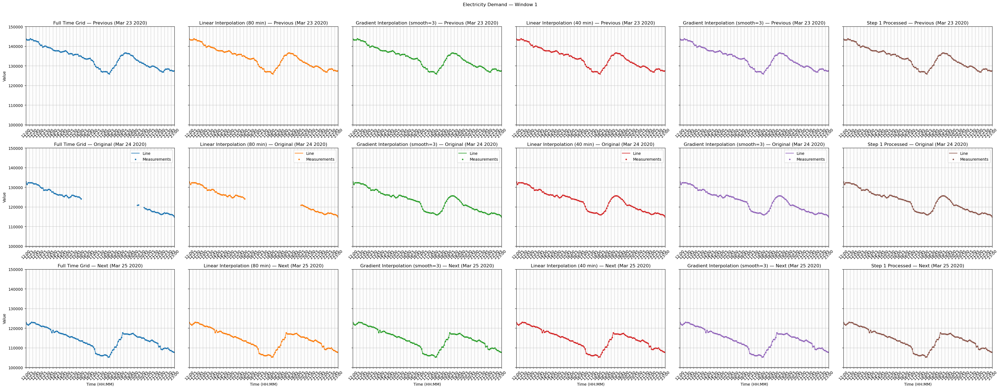

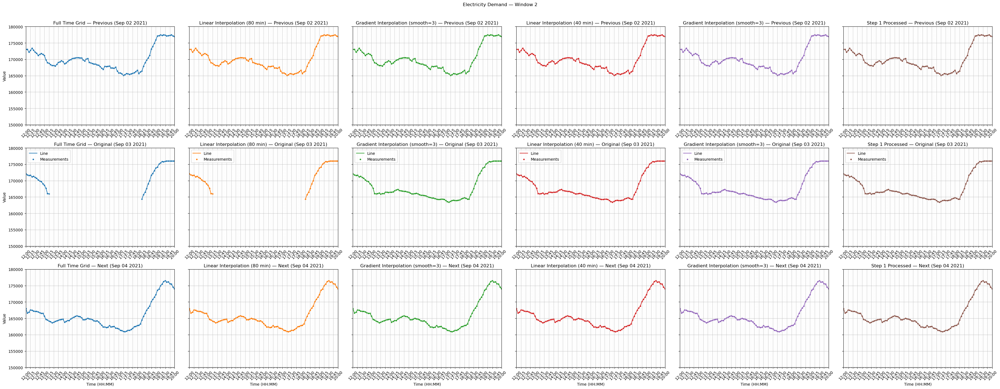

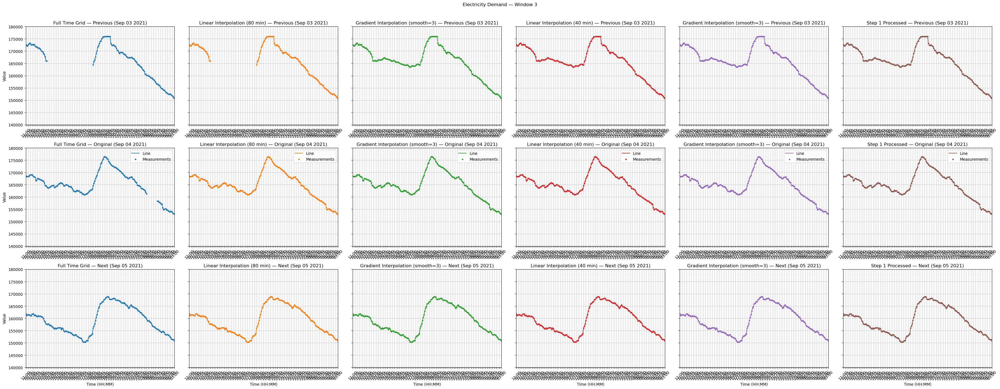

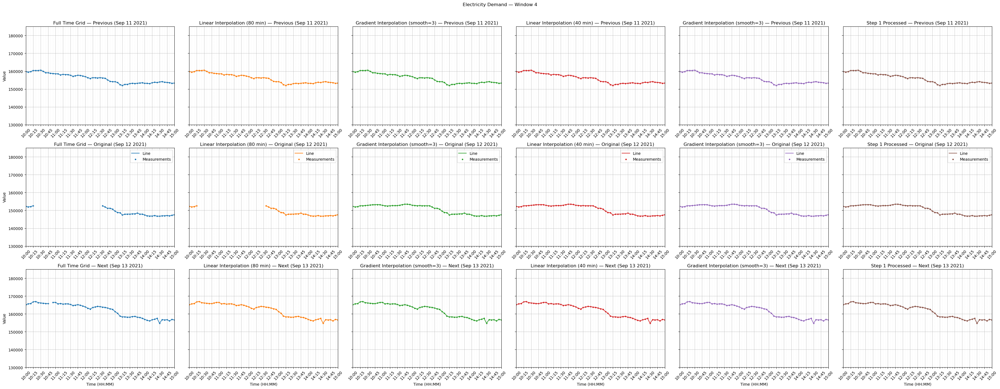

Locator attempting to generate 2005 ticks ([19107.0, ..., 19113.958333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2005 ticks ([19107.0, ..., 19113.958333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2005 ticks ([19107.0, ..., 19113.958333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2005 ticks ([19107.0, ..., 19113.958333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2005 ticks ([19107.0, ..., 19113.958333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2005 ticks ([19107.0, ..., 19113.958333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2005 ticks ([19108.0, ..., 19114.958333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2005 ticks ([19108.0, ..., 19114.958333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2005 ticks ([1910

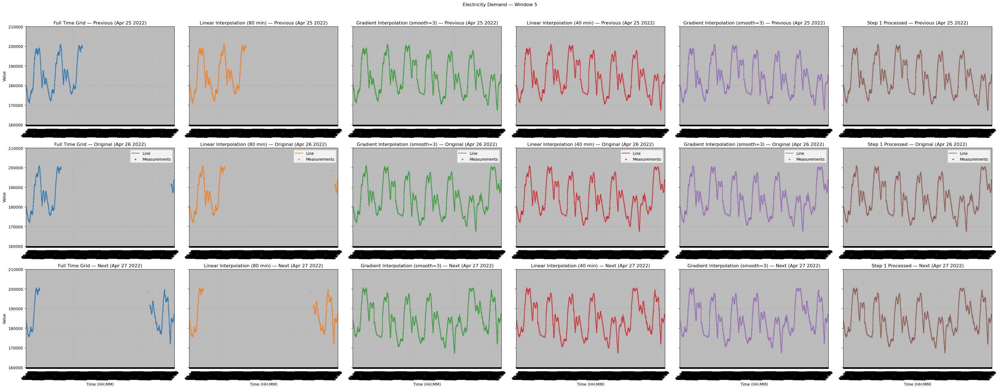

Locator attempting to generate 1717 ticks ([19108.0, ..., 19113.958333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 1717 ticks ([19108.0, ..., 19113.958333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 1717 ticks ([19108.0, ..., 19113.958333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 1717 ticks ([19108.0, ..., 19113.958333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 1717 ticks ([19108.0, ..., 19113.958333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 1717 ticks ([19108.0, ..., 19113.958333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 1717 ticks ([19109.0, ..., 19114.958333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 1717 ticks ([19109.0, ..., 19114.958333333332]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 1717 ticks ([1910

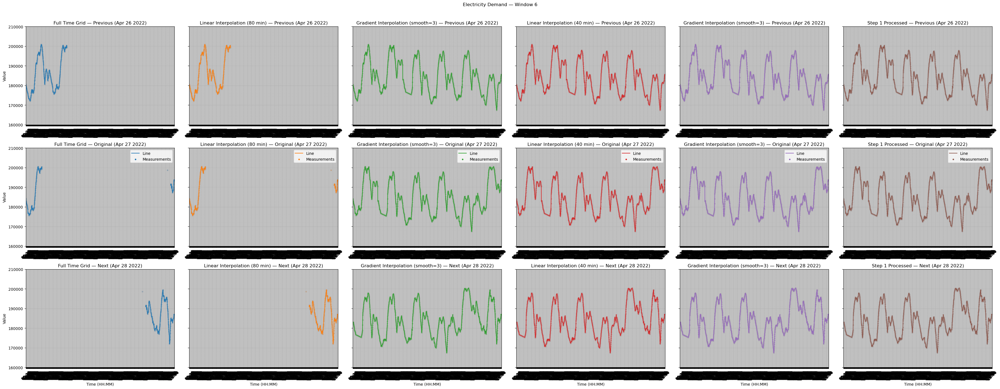

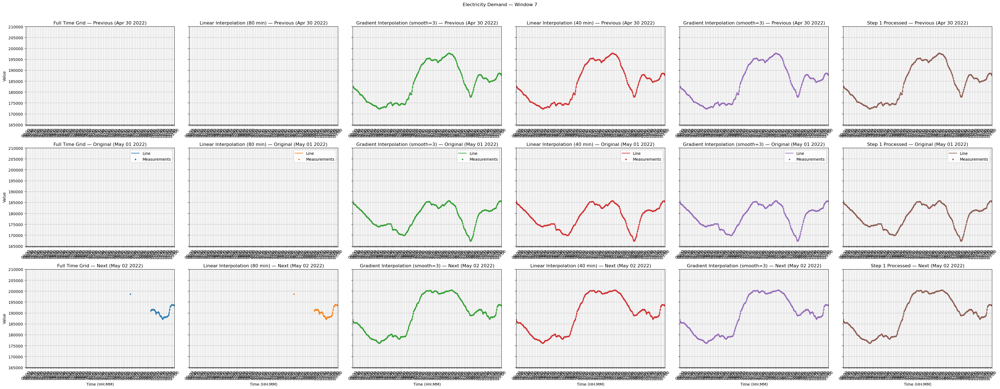

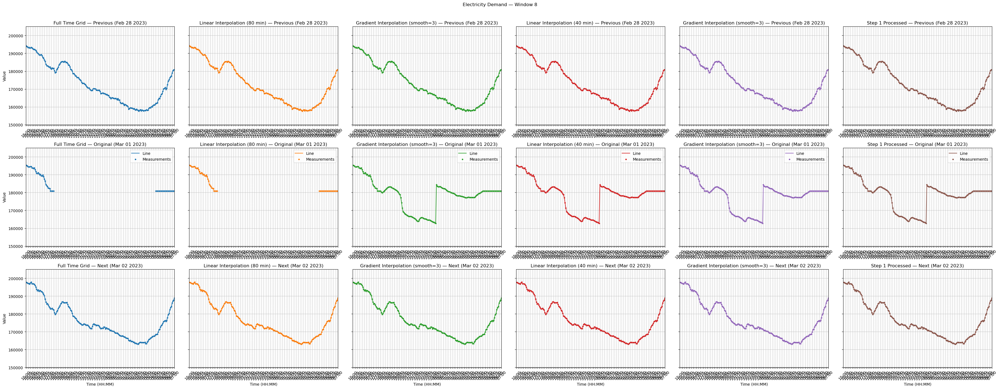

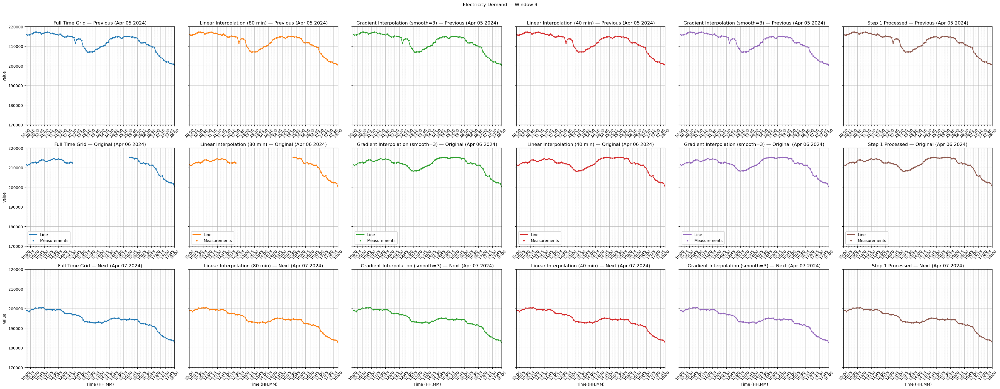

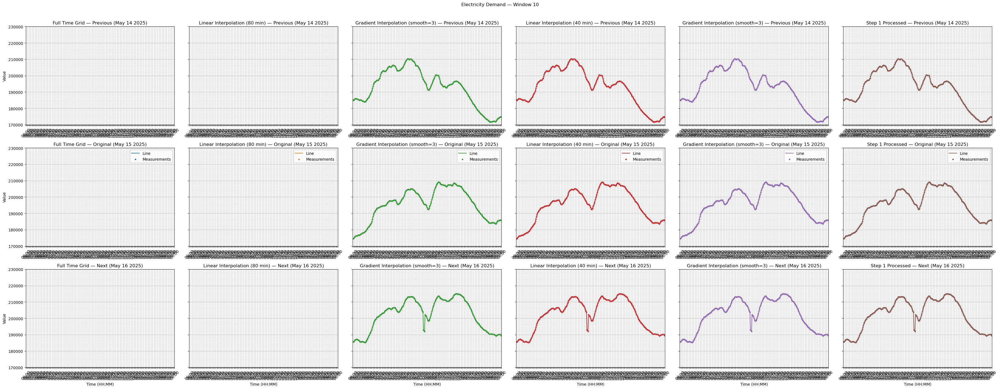

In [46]:
batch_plot_from_lists(
    dataframes_to_plot,
    start_boundaries,
    end_boundaries,
    ylimits,
    timestamp_col="timestamp",
    plot_col="demand_met",
    offset_hours=24,
    titles=col_titles,               # optional
    base_title_prefix="Electricity Demand — ",
    width_per_col=6,
    height=14,
    sharey=True,
    align_ylim=True,                 # ignored when a per-window ylim is provided
    point_size=8,
    save=False,                      # flip to True to write PNGs
    # save_dir="figs",               # set when save=True
)

##### Visualisations - Individual Plots - Good Day

In [56]:
tz = zoneinfo.ZoneInfo("Asia/Kolkata")
start_boundary_11tz = datetime(2025, 2, 17, 0, tzinfo=tz)
end_boundary_11tz = datetime(2025, 2, 17, 23, tzinfo=tz)
ylim_11 = (150000, 240000)

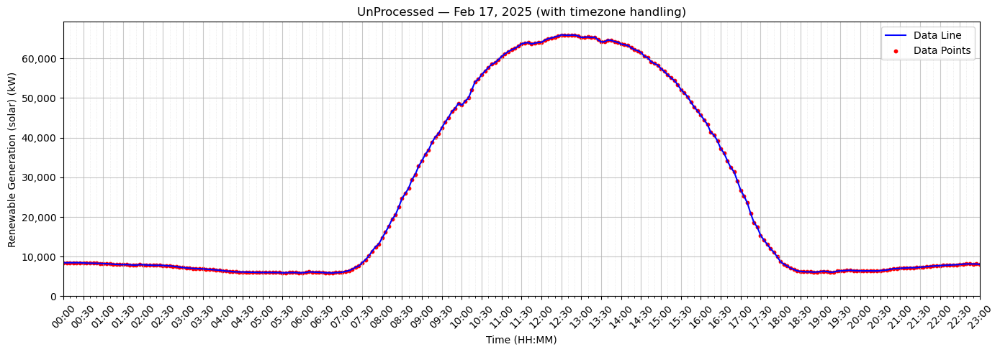

In [85]:
plot_time_series_with_ticks_smart(
    df=full_time_join_grid_data,              # naive
    timestamp_col="timestamp",
    plot_col="renewable_generation",
    start_boundary=start_boundary_11tz,
    end_boundary=end_boundary_11tz,
    y_label="Renewable Generation (solar) (kW)",
    title="UnProcessed — Feb 17, 2025 (with timezone handling)",
    display_tz="Asia/Kolkata",
    naive_policy="assume_local",           # key
)

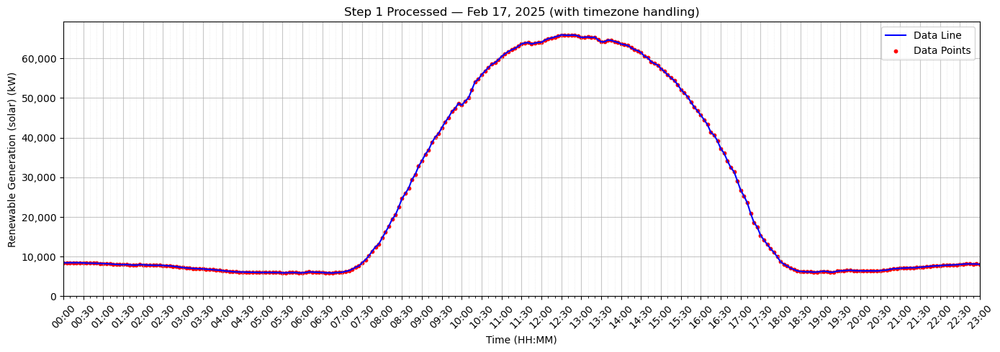

In [86]:
plot_time_series_with_ticks_smart(
    df=step_1_processed_pldf,              # naive
    timestamp_col="timestamp",
    plot_col="renewable_generation",
    start_boundary=start_boundary_11tz,
    end_boundary=end_boundary_11tz,
    y_label="Renewable Generation (solar) (kW)",
    title="Step 1 Processed — Feb 17, 2025 (with timezone handling)",
    display_tz="Asia/Kolkata",
    naive_policy="assume_local",           # key

)

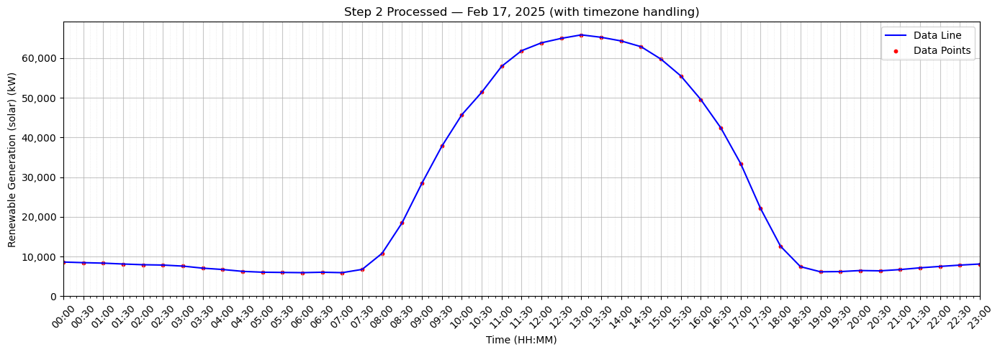

In [87]:
plot_time_series_with_ticks_smart(
    df=step_2_processed_pldf,              # naive
    timestamp_col="timestamp",
    plot_col="renewable_generation",
    start_boundary=start_boundary_11tz,
    end_boundary=end_boundary_11tz,
    y_label="Renewable Generation (solar) (kW)",
    title="Step 2 Processed — Feb 17, 2025 (with timezone handling)",
    display_tz="Asia/Kolkata",
    naive_policy="assume_local",           # key
)

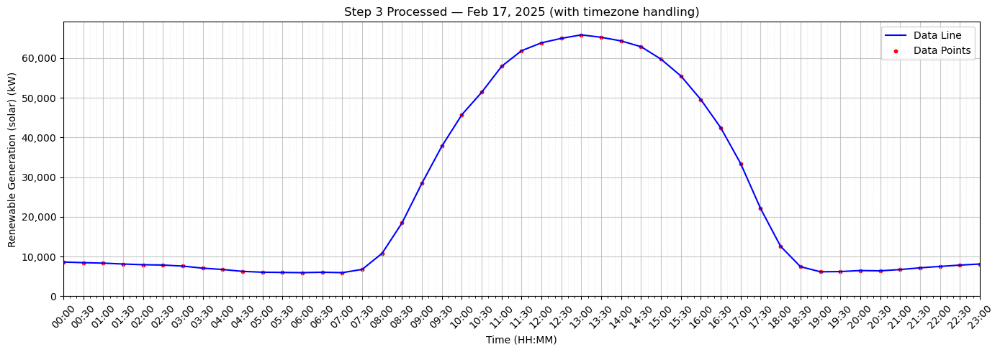

In [88]:
plot_time_series_with_ticks_smart(
    df=step_3_processed_pldf,              # naive
    timestamp_col="timestamp",
    plot_col="renewable_generation",
    start_boundary=start_boundary_11tz,
    end_boundary=end_boundary_11tz,
    y_label="Renewable Generation (solar) (kW)",
    title="Step 3 Processed — Feb 17, 2025 (with timezone handling)",
    display_tz="Asia/Kolkata",
    naive_policy="assume_local",           # key
)

##### Visualisations - Filled Day

In [97]:
start_boundary_1tz = datetime(2020, 3, 24, hour=0, tzinfo=tz)
end_boundary_1tz = datetime(2020, 3, 24, 23, tzinfo=tz)
ylim_1 = (100000, 150000)


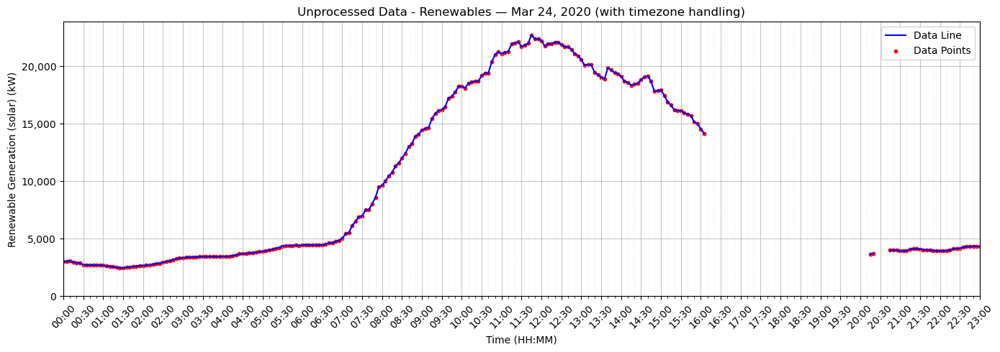

In [ ]:
plot_time_series_with_ticks_smart(
    df=full_time_join_grid_data,              # naive
    timestamp_col="timestamp",
    plot_col="renewable_generation",
    start_boundary=start_boundary_1tz,
    end_boundary=end_boundary_1tz,
    y_label="Renewable Generation (solar) (kW)",
    title="Unprocessed Data - Renewables — Mar 24, 2020",
    display_tz="Asia/Kolkata",
    naive_policy="assume_local",           # key
)

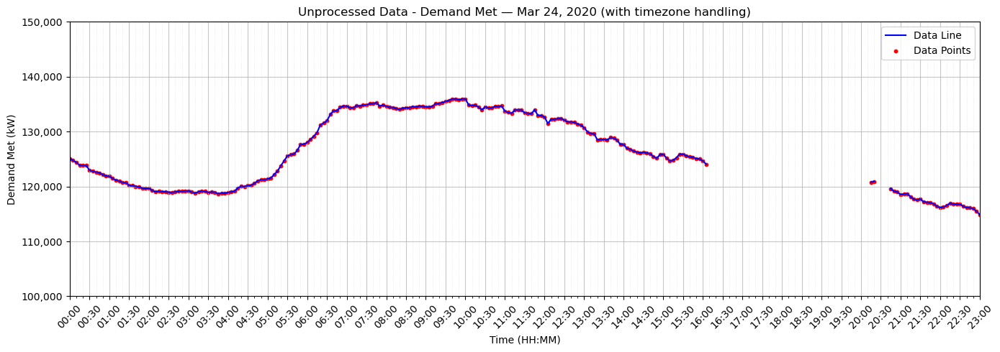

In [ ]:
plot_time_series_with_ticks_smart(
    df=full_time_join_grid_data,              # naive
    timestamp_col="timestamp",
    plot_col="demand_met",
    start_boundary=start_boundary_1tz,
    end_boundary=end_boundary_1tz,
    y_label="Demand Met (kW)",
    title="Unprocessed Data - Demand Met — Mar 24, 2020",
    display_tz="Asia/Kolkata",
    naive_policy="assume_local",           # key
    ylim=ylim_1
)

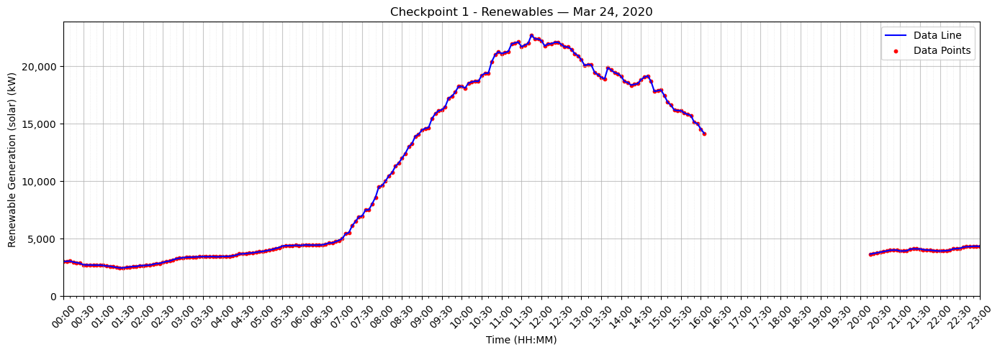

In [113]:
plot_time_series_with_ticks_smart(
    df=checkpoint_1_pldf,              # naive
    timestamp_col="timestamp",
    plot_col="renewable_generation",
    start_boundary=start_boundary_1tz,
    end_boundary=end_boundary_1tz,
    y_label="Renewable Generation (solar) (kW)",
    title="Checkpoint 1 - Renewables — Mar 24, 2020",
    display_tz="Asia/Kolkata",
    naive_policy="assume_local",           # key,
)

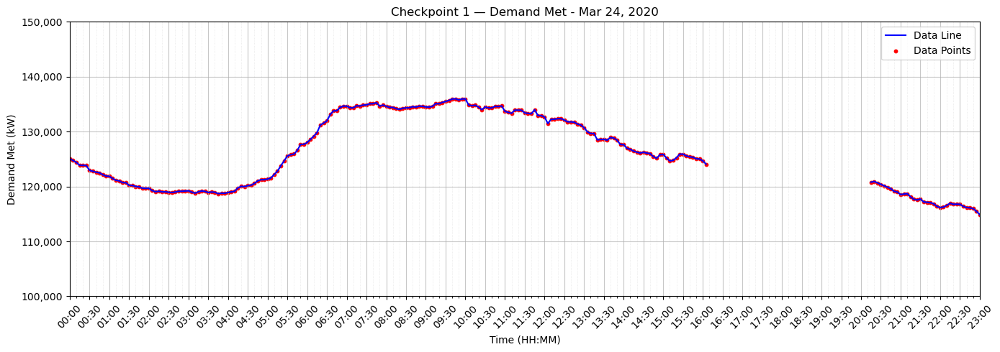

In [114]:
plot_time_series_with_ticks_smart(
    df=checkpoint_1_pldf,              # naive
    timestamp_col="timestamp",
    plot_col="demand_met",
    start_boundary=start_boundary_1tz,
    end_boundary=end_boundary_1tz,
    y_label="Demand Met (kW)",
    title="Checkpoint 1 — Demand Met - Mar 24, 2020",
    display_tz="Asia/Kolkata",
    naive_policy="assume_local",           # key,
        ylim=ylim_1
)

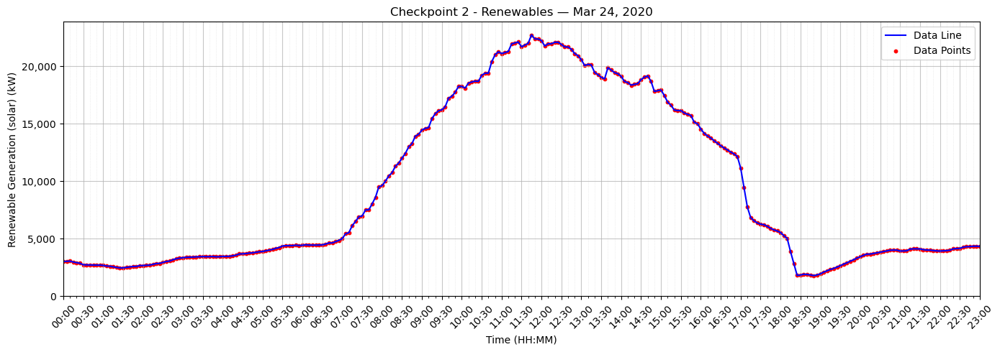

In [115]:
plot_time_series_with_ticks_smart(
    df=checkpoint_2_pldf,              # naive
    timestamp_col="timestamp",
    plot_col="renewable_generation",
    start_boundary=start_boundary_1tz,
    end_boundary=end_boundary_1tz,
    y_label="Renewable Generation (solar) (kW)",
    title="Checkpoint 2 - Renewables — Mar 24, 2020",
    display_tz="Asia/Kolkata",
    naive_policy="assume_local",           # key

)

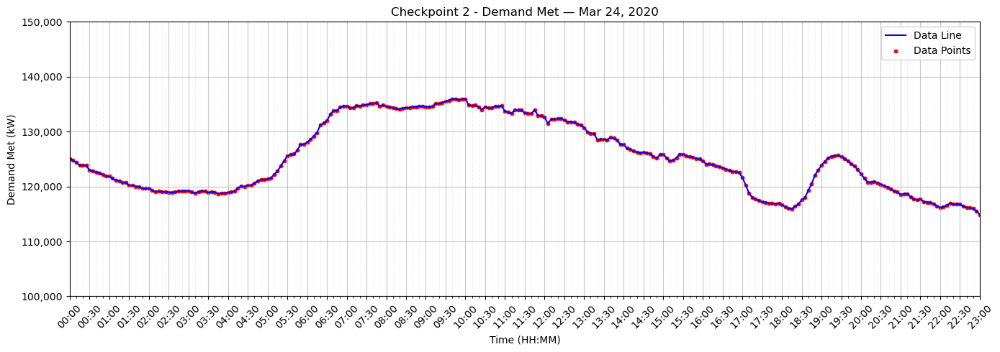

In [116]:
plot_time_series_with_ticks_smart(
    df=checkpoint_2_pldf,              # naive
    timestamp_col="timestamp",
    plot_col="demand_met",
    start_boundary=start_boundary_1tz,
    end_boundary=end_boundary_1tz,
    y_label="Demand Met (kW)",
    title="Checkpoint 2 - Demand Met — Mar 24, 2020",
    display_tz="Asia/Kolkata",
    naive_policy="assume_local",           # key
    ylim=ylim_1

)

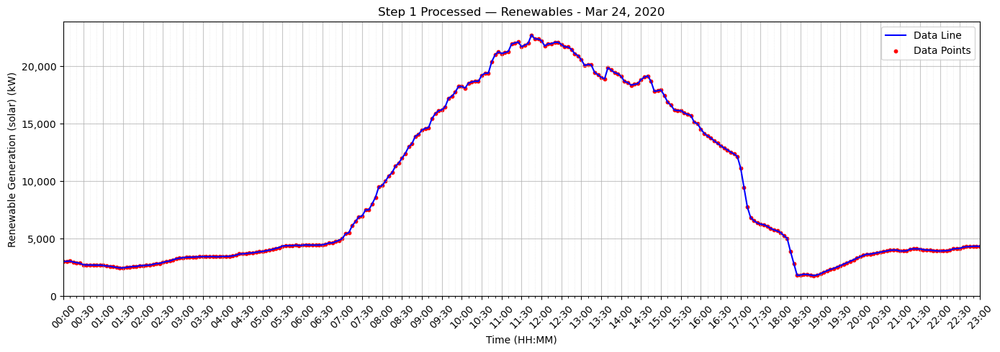

In [117]:
plot_time_series_with_ticks_smart(
    df=step_1_processed_pldf,              # naive
    timestamp_col="timestamp",
    plot_col="renewable_generation",
    start_boundary=start_boundary_1tz,
    end_boundary=end_boundary_1tz,
    y_label="Renewable Generation (solar) (kW)",
    title="Step 1 Processed — Renewables - Mar 24, 2020",
    display_tz="Asia/Kolkata",
    naive_policy="assume_local",           # key
)

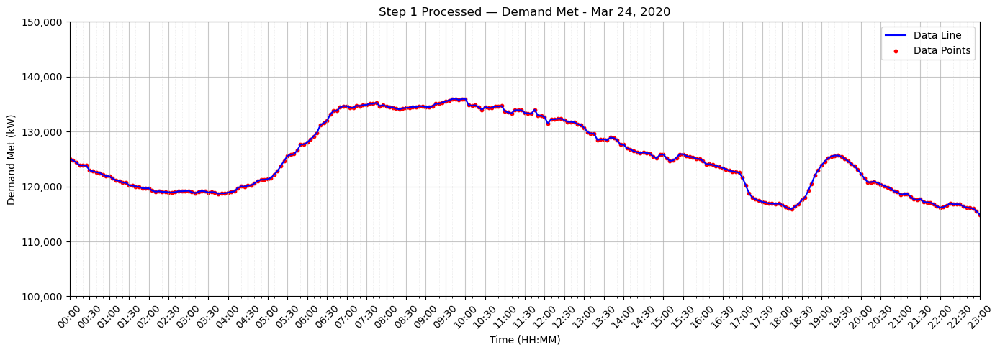

In [118]:
plot_time_series_with_ticks_smart(
    df=step_1_processed_pldf,              # naive
    timestamp_col="timestamp",
    plot_col="demand_met",
    start_boundary=start_boundary_1tz,
    end_boundary=end_boundary_1tz,
    y_label="Demand Met (kW)",
    title="Step 1 Processed — Demand Met - Mar 24, 2020",
    display_tz="Asia/Kolkata",
    naive_policy="assume_local",           # key
    ylim=ylim_1
)

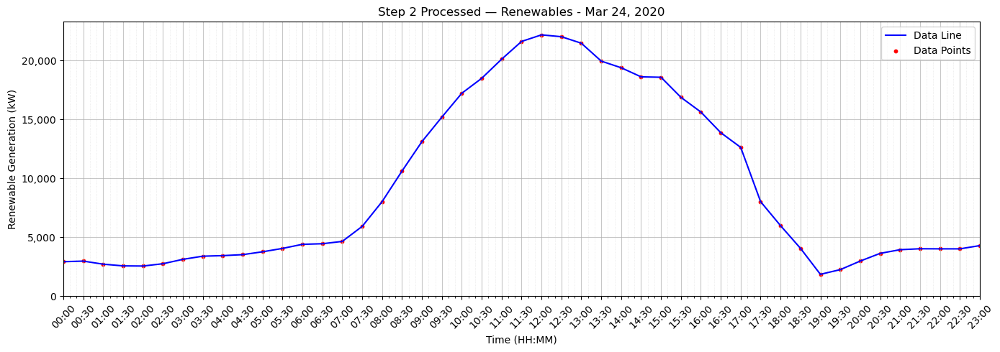

In [119]:
plot_time_series_with_ticks_smart(
    df=step_2_processed_pldf,              # naive
    timestamp_col="timestamp",
    plot_col="renewable_generation",
    start_boundary=start_boundary_1tz,
    end_boundary=end_boundary_1tz,
    y_label="Renewable Generation (kW)",
    title="Step 2 Processed — Renewables - Mar 24, 2020",
    display_tz="Asia/Kolkata",
    naive_policy="assume_local",           # key
)

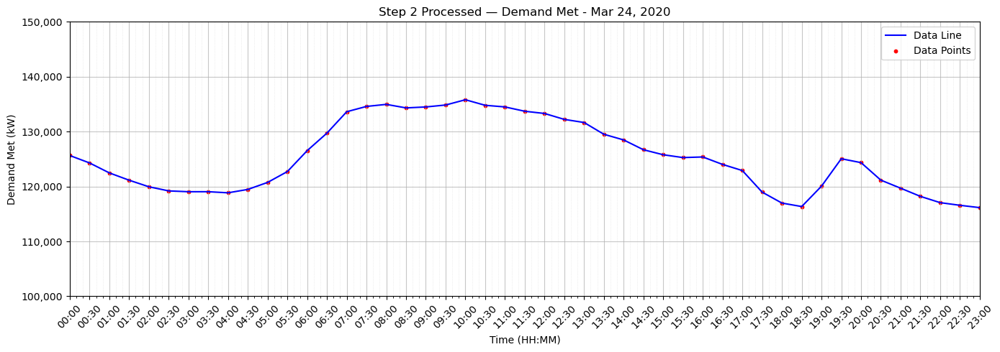

In [120]:
plot_time_series_with_ticks_smart(
    df=step_2_processed_pldf,              # naive
    timestamp_col="timestamp",
    plot_col="demand_met",
    start_boundary=start_boundary_1tz,
    end_boundary=end_boundary_1tz,
    y_label="Demand Met (kW)",
    title="Step 2 Processed — Demand Met - Mar 24, 2020",
    display_tz="Asia/Kolkata",
    naive_policy="assume_local",           # key
    ylim=ylim_1
)

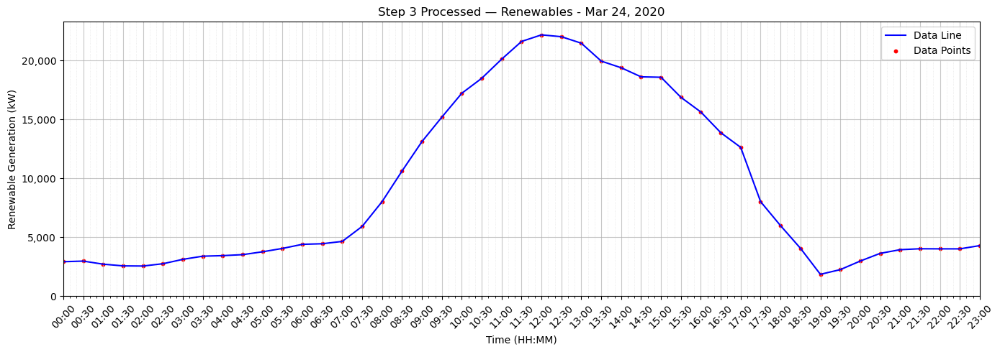

In [121]:
plot_time_series_with_ticks_smart(
    df=step_3_processed_pldf,              # naive
    timestamp_col="timestamp",
    plot_col="renewable_generation",
    start_boundary=start_boundary_1tz,
    end_boundary=end_boundary_1tz,
    y_label="Renewable Generation (kW)",
    title="Step 3 Processed — Renewables - Mar 24, 2020",
    display_tz="Asia/Kolkata",
    naive_policy="assume_local",           # key
)

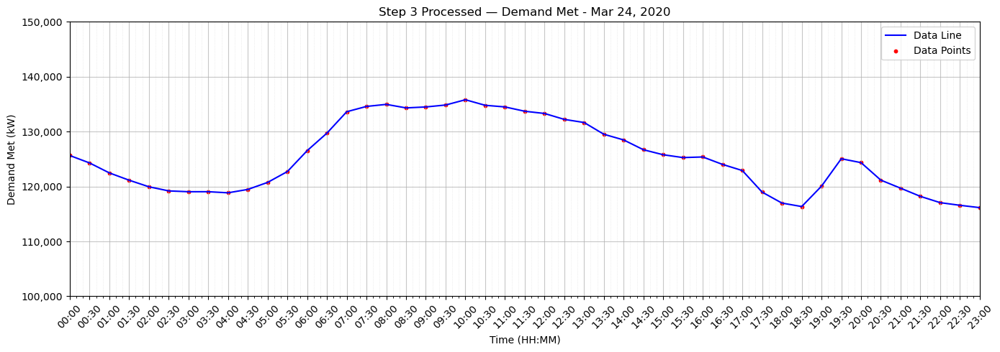

In [122]:
plot_time_series_with_ticks_smart(
    df=step_3_processed_pldf,              # naive
    timestamp_col="timestamp",
    plot_col="demand_met",
    start_boundary=start_boundary_1tz,
    end_boundary=end_boundary_1tz,
    y_label="Demand Met (kW)",
    title="Step 3 Processed — Demand Met - Mar 24, 2020",
    display_tz="Asia/Kolkata",
    naive_policy="assume_local",           # key
    ylim=ylim_1
)